In [1]:
from datasets import (
    create_valid_dataset_multi, create_valid_loader
)
from datasets_DDSM import (
    create_test_dataset_DDSM_multi
)
from models_multiview.create_multiview_model import create_model
from torch_utils import utils
from torchmetrics.detection.mean_ap import MeanAveragePrecision
from pprint import pprint
from tqdm import tqdm
from utils import transforms as T
import torch
import argparse
import yaml
import torchvision
import torchvision.transforms.functional as F
import time
import numpy as np
from torch_utils import froc
import matplotlib.pyplot as plt
import cv2
torch.multiprocessing.set_sharing_strategy('file_system')
from typing import Dict, List, Optional, Tuple, Union
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

In [2]:
data_configs= {
    'TRAIN_DIR_IMAGES' : '../VinDr_Mammo/physionet.org/files/vindr-mammo/1.0.0/images/',
    'TRAIN_DIR_LABELS' : '../VinDr_Mammo/physionet.org/files/vindr-mammo/1.0.0/',
    'VALID_DIR_IMAGES' : '../VinDr_Mammo/physionet.org/files/vindr-mammo/1.0.0/images/',
    'VALID_DIR_LABELS' : '../VinDr_Mammo/physionet.org/files/vindr-mammo/1.0.0/',
# Class names.
    'CLASSES' :[
    '__background__',
    'Mass',


],

# Number of classes (object classes + 1 for background class in Faster RCNN).
    'NC' : 2,

# Whether to save the predictions of the validation set while training.
    'SAVE_VALID_PREDICTION_IMAGES' : True,
}
data_configs

{'TRAIN_DIR_IMAGES': '../VinDr_Mammo/physionet.org/files/vindr-mammo/1.0.0/images/',
 'TRAIN_DIR_LABELS': '../VinDr_Mammo/physionet.org/files/vindr-mammo/1.0.0/',
 'VALID_DIR_IMAGES': '../VinDr_Mammo/physionet.org/files/vindr-mammo/1.0.0/images/',
 'VALID_DIR_LABELS': '../VinDr_Mammo/physionet.org/files/vindr-mammo/1.0.0/',
 'CLASSES': ['__background__', 'Mass'],
 'NC': 2,
 'SAVE_VALID_PREDICTION_IMAGES': True}

In [3]:
args={
    'model' : 'multiview_detector_swint',
    'weights' : 'outputs/training/multi_swint_crop_small_eval2_40/best_model.pth',
    'batch' : 1,
    'workers': 8,
    'device' : 'cpu',
    'imgsz' : (500, 1200),
    
}

In [4]:
from typing import Dict, List, Optional, Tuple
import math
from collections import OrderedDict
import torch
import torch.nn.functional as F
import torchvision
from torch import nn, Tensor
from torchvision.ops import boxes as box_ops, roi_align
from torchvision.models.detection.roi_heads import RoIHeads 
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from detection.transformer import CrossviewTransformer
from detection.position_encoding import PositionEmbeddingSine
from detection.loss import fastrcnn_loss1, Mix_loss, Focal_loss_l1



def pad_sequence(sequences, batch_first=True, padding_value=0):
    """
    Pad a list of variable length tensors with zeros to create a tensor with uniform shape.
    Args:
        sequences: list of PyTorch tensors
        batch_first: If True, the returned tensor will have shape (batch_size, max_sequence_length, *)
                     If False, the returned tensor will have shape (max_sequence_length, batch_size, *)
        padding_value: The value used to pad the sequences
    Returns:
        A PyTorch tensor of shape (batch_size, max_sequence_length, *) or (max_sequence_length, batch_size, *)
    """
    device= sequences[0].device
    # Find the maximum sequence length
    max_length = max([len(seq) for seq in sequences])
    # Pad the sequences with zeros
    padded_sequences = [torch.nn.functional.pad(seq, (0, 0, 0, max_length - len(seq)), value=padding_value) for seq in sequences]

    # Stack the padded sequences into a single tensor
    padded_tensor = torch.stack(padded_sequences, dim=0)
    mask_seq = [len(seq) for seq in sequences]
    mask= torch.zeros(padded_tensor.shape[:2], dtype = torch.bool)
    for i in range(len(sequences)):
        mask[i, mask_seq[i]:] = True
    # Transpose the tensor if batch_first is False
    if not batch_first:
        padded_tensor = padded_tensor.transpose(0, 1)
    padded_tensor = padded_tensor.to(device)
    mask = mask.to(device)
    return padded_tensor, mask




class Multi_roi_heads1(RoIHeads):
    def __init__(self,
        box_roi_pool,
        box_head,
        box_predictor,
        # Faster R-CNN training
        fg_iou_thresh,
        bg_iou_thresh,
        batch_size_per_image,
        positive_fraction,
        bbox_reg_weights,
        # Faster R-CNN inference
        score_thresh,
        nms_thresh,
        detections_per_img,
        # transformer
        use_self_attn,
        # Mask
        mask_roi_pool=None,
        mask_head=None,
        mask_predictor=None,
        keypoint_roi_pool=None,
        keypoint_head=None,
        keypoint_predictor=None,
         
        # compute attention
        compute_attn= False,
        loss_type= 'fasterrcnn1'):
        super().__init__(box_roi_pool,
        box_head,
        box_predictor,
        # Faster R-CNN training
        fg_iou_thresh,
        bg_iou_thresh,
        batch_size_per_image,
        positive_fraction,
        bbox_reg_weights,
        # Faster R-CNN inference
        score_thresh,
        nms_thresh,
        detections_per_img,
        # Mask
        mask_roi_pool=None,
        mask_head=None,
        mask_predictor=None,
        keypoint_roi_pool=None,
        keypoint_head=None,
        keypoint_predictor=None,
        )
        
        
        self.crossview = CrossviewTransformer(use_self_attn=use_self_attn, compute_attn=compute_attn)
        self.pos_encode = PositionEmbeddingSine(512)
        self.loss_type =loss_type 
        if self.loss_type == 'fasterrcnn1':
                self.loss_func = fastrcnn_loss1
        elif self.loss_type == 'mix':
            self.loss_func = Mix_loss
        elif self.loss_type == 'focal':
            self.loss_func= Focal_loss_l1
        else:
            print('wrong loss')
            raise Exception()
        
    def postprocess_detections(
        self,
        class_logits,  # type: Tensor
        box_regression,  # type: Tensor
        proposals,  # type: List[Tensor]
        image_shapes,  # type: List[Tuple[int, int]]
    ):
        # type: (...) -> Tuple[List[Tensor], List[Tensor], List[Tensor]]
        device = class_logits.device
        num_classes = class_logits.shape[-1]

        boxes_per_image = [boxes_in_image.shape[0] for boxes_in_image in proposals]
        pred_boxes = self.box_coder.decode(box_regression, proposals)

        pred_scores = torch.sigmoid(class_logits)

        pred_boxes_list = pred_boxes.split(boxes_per_image, 0)
        pred_scores_list = pred_scores.split(boxes_per_image, 0)

        
        
        all_boxes = []
        all_scores = []
        all_labels = []
        index = []
        for boxes, scores, image_shape in zip(pred_boxes_list, pred_scores_list, image_shapes):
            boxes = box_ops.clip_boxes_to_image(boxes, image_shape)

            # create labels for each prediction
            labels = torch.arange(num_classes, device=device)
            labels = labels.view(1, -1).expand_as(scores)

            # remove predictions with the background label
            boxes = boxes[:, 1:]
            scores = scores[:, 1:]
            labels = labels[:, 1:]

            # batch everything, by making every class prediction be a separate instance
            boxes = boxes.reshape(-1, 4)
            scores = scores.reshape(-1)
            labels = labels.reshape(-1)

            # remove low scoring boxes
            #print((scores > self.score_thresh).shape)
            inds = torch.where(scores > self.score_thresh)[0]
            
            boxes, scores, labels = boxes[inds], scores[inds], labels[inds]

            # remove empty boxes
            keep1 = box_ops.remove_small_boxes(boxes, min_size=1e-2)
            boxes, scores, labels = boxes[keep1], scores[keep1], labels[keep1]

            # non-maximum suppression, independently done per class
            keep2 = box_ops.batched_nms(boxes, scores, labels, self.nms_thresh)
            # keep only topk scoring predictions
            keep = keep2[: self.detections_per_img]
            boxes, scores, labels = boxes[keep], scores[keep], labels[keep]

            all_boxes.append(boxes)
            all_scores.append(scores)
            all_labels.append(labels)
            index.append(inds[keep1[keep]].clone())
        return all_boxes, all_scores, all_labels, index
    
    def forward(
        self,
        feat_CC,  # type: Dict[str, Tensor]
        proposals_CC,  # type: List[Tensor]
        image_shapes_CC,  # type: List[Tuple[int, int]]
        feat_MLO,
        proposals_MLO,
        image_shapes_MLO,
        target_CC=None,  # type: Optional[List[Dict[str, Tensor]]]
        target_MLO=None,
    ):
        # type: (...) -> Tuple[List[Dict[str, Tensor]], Dict[str, Tensor]]
        """
        Args:
            features (List[Tensor])
            proposals (List[Tensor[N, 4]])
            image_shapes (List[Tuple[H, W]])
            targets (List[Dict])
        """
        if target_CC is not None:
            for t in target_CC:
                # TODO: https://github.com/pytorch/pytorch/issues/26731
                floating_point_types = (torch.float, torch.double, torch.half)
                if not t["boxes"].dtype in floating_point_types:
                    print(t["boxes"])
                    raise TypeError(f"target boxes must of float type, instead got {t['boxes'].dtype}")
                if not t["labels"].dtype == torch.int64:
                    raise TypeError(f"target labels must of int64 type, instead got {t['labels'].dtype}")
                if self.has_keypoint():
                    if not t["keypoints"].dtype == torch.float32:
                        raise TypeError(f"target keypoints must of float type, instead got {t['keypoints'].dtype}")

        if self.training:
            proposals_CC, matched_idxs_CC, labels_CC, regression_targets_CC = self.select_training_samples(proposals_CC, target_CC)
            proposals_MLO, matched_idxs_MLO, labels_MLO, regression_targets_MLO = self.select_training_samples(proposals_MLO, target_MLO)
        else:
            labels_CC = None
            labels_MLO = None
            regression_targets_CC = None
            regression_targets_MLO = None
            matched_idxs_CC = None
            matched_idxs_MLO = None
        box_features_CC = self.box_roi_pool(feat_CC, proposals_CC, image_shapes_CC)
        box_features_MLO = self.box_roi_pool(feat_MLO, proposals_MLO, image_shapes_MLO)

        box_features_CC = self.box_head(box_features_CC)
        box_features_MLO =self.box_head(box_features_MLO)
        boxes_per_image_CC = [boxes_in_image.shape[0] for boxes_in_image in proposals_CC]
        boxes_per_image_MLO = [boxes_in_image.shape[0] for boxes_in_image in proposals_MLO]
        box_features_CC = box_features_CC.split(boxes_per_image_CC, 0)
        box_features_MLO = box_features_MLO.split(boxes_per_image_MLO, 0)
        
        box_features_CC,  CC_key_padding_mask = pad_sequence(box_features_CC)
        box_features_MLO,  MLO_key_padding_mask = pad_sequence(box_features_MLO)
        
        CC_pos = self.pos_encode(proposals_CC)
        MLO_pos = self.pos_encode(proposals_MLO)
        CC_pos, _ = pad_sequence(CC_pos)
        MLO_pos, _ = pad_sequence(MLO_pos)
        #CC_pos= None 
        #MLO_pos =None
        #CC_key_padding_mask = box_features_CC == 0
        #MLO_key_padding_mask = box_features_MLO == 0
        
        box_features_CC, box_features_MLO = self.crossview(box_features_CC, box_features_MLO, CC_key_padding_mask, MLO_key_padding_mask,\
            CC_pos= CC_pos, MLO_pos= MLO_pos)
        
        box_features_CC = box_features_CC[~CC_key_padding_mask]
        box_features_MLO = box_features_MLO[~MLO_key_padding_mask]
        class_logits_CC, box_regression_CC = self.box_predictor(box_features_CC)
        class_logits_MLO, box_regression_MLO = self.box_predictor(box_features_MLO)


        result_CC: List[Dict[str, torch.Tensor]] = []
        result_MLO: List[Dict[str, torch.Tensor]] = []
        self.proposals : List[Dict[str, torch.Tensor]] = []
        self.index :  List[Dict[str, torch.Tensor]] = []
        loss_CC = {}
        loss_MLO = {}
        if self.training:
            if labels_CC is None or labels_MLO is None:
                raise ValueError("labels cannot be None")
            if regression_targets_CC is None or regression_targets_MLO is None:
                raise ValueError("regression_targets cannot be None")
            
            if self.loss_type == 'mix':
                box_regression_CC = self.box_coder.decode(box_regression_CC, proposals_CC)
                regression_targets_CC = torch.cat(regression_targets_CC, dim =0)
                regression_targets_CC = self.box_coder.decode(regression_targets_CC, proposals_CC).squeeze(1)
                box_regression_MLO = self.box_coder.decode(box_regression_MLO, proposals_MLO)
                regression_targets_MLO = torch.cat(regression_targets_MLO, dim=0)
                regression_targets_MLO = self.box_coder.decode(regression_targets_MLO, proposals_MLO).squeeze(1)

            
            if torch.any(torch.isnan(class_logits_CC)):
                print('finding nan')
            loss_classifier_CC, loss_box_reg_CC = self.loss_func(class_logits_CC, box_regression_CC, labels_CC, regression_targets_CC)
            loss_classifier_MLO, loss_box_reg_MLO = self.loss_func(class_logits_MLO, box_regression_MLO, labels_MLO, regression_targets_MLO)
            loss_CC= {"loss_classifier": loss_classifier_CC, "loss_box_reg": loss_box_reg_CC }
            loss_MLO = {"loss_classifier": loss_classifier_MLO, "loss_box_reg": loss_box_reg_MLO}
        else:
            boxes_CC, scores_CC, labels_CC, index_CC = self.postprocess_detections(class_logits_CC, box_regression_CC, proposals_CC, image_shapes_CC)
            boxes_MLO, scores_MLO, labels_MLO, index_MLO = self.postprocess_detections(class_logits_MLO, box_regression_MLO, proposals_MLO, image_shapes_MLO)

            num_images = len(boxes_CC)
            for i in range(num_images):
                result_CC.append(
                    {
                        "boxes": boxes_CC[i],
                        "labels": labels_CC[i],
                        "scores": scores_CC[i],
                    }
                )
                self.proposals.append(
                    {
                        "CC": proposals_CC[i],
                        "MLO": proposals_MLO[i]
                    }
                )
                self.index.append(
                    {
                        "CC" : index_CC[i],
                        "MLO" : index_MLO[i]
                    }
                )
            num_images = len(boxes_MLO)
            for i in range(num_images):
                result_MLO.append(
                    {
                        "boxes": boxes_MLO[i],
                        "labels": labels_MLO[i],
                        "scores": scores_MLO[i],
                    }
                )


        return result_CC, result_MLO, loss_CC, loss_MLO



In [5]:
import warnings
from collections import OrderedDict
from typing import Dict, List, Optional, Tuple, Union
import matplotlib.pyplot as plt
import cv2
from utils import transforms as T


import numpy as np
import torch 
import torchvision
from torch import nn, Tensor
from torchvision.models.detection import generalized_rcnn, faster_rcnn, roi_heads
from detection.Multi_roi_heads import Multi_roi_heads
from detection.fpn import _swin_fpn_extractor
from torchvision.ops import misc as misc_nn_ops
from torchvision.models.detection.backbone_utils import _resnet_fpn_extractor, _validate_trainable_layers, BackboneWithFPN
from torchvision.models.swin_transformer import swin_t, Swin_T_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor, TwoMLPHead
from torchvision.models.detection.transform import GeneralizedRCNNTransform
from torchvision.ops import MultiScaleRoIAlign
import torch.nn.functional as F
from utils.norm import get_layer, set_layer, LayerNorm2d
try: # Use test images if present.
    VALID_DIR_IMAGES = data_configs['TEST_DIR_IMAGES']
    VALID_DIR_LABELS = data_configs['TEST_DIR_LABELS']
except: # Else use the validation images.
    VALID_DIR_IMAGES = data_configs['VALID_DIR_IMAGES']
    VALID_DIR_LABELS = data_configs['VALID_DIR_LABELS']
NUM_CLASSES = data_configs['NC']
CLASSES = data_configs['CLASSES']
NUM_WORKERS = args['workers']
DEVICE = args['device']
BATCH_SIZE = args['batch']

# Model configurations
IMAGE_SIZE = args['imgsz']

# Load the pretrained model
create_model1 = create_model[args['model']]
if args['weights'] is None:
    model = create_model1(num_classes=NUM_CLASSES, norm = None,size= IMAGE_SIZE, coco_model=False, compute_attn =True)


# Load weights.
if args['weights'] is not None:
    model = create_model1(num_classes=NUM_CLASSES, norm = None,size= IMAGE_SIZE, coco_model=False, compute_attn =True)
    out_channels = model.backbone.out_channels
    box_roi_pool=None
    box_head=None
    box_predictor=None
    box_score_thresh= 1e-7
    box_nms_thresh=0.1
    box_detections_per_img=100
    box_fg_iou_thresh=0.5
    box_bg_iou_thresh=0.5
    box_batch_size_per_image=512
    box_positive_fraction=0.25
    bbox_reg_weights=None
    if box_roi_pool is None:
        box_roi_pool = MultiScaleRoIAlign(featmap_names=["0", "1", "2", "3"], output_size=7, sampling_ratio=2)

    if box_head is None:
        resolution = box_roi_pool.output_size[0]
        representation_size = 1024
        box_head = TwoMLPHead(out_channels * resolution**2, representation_size)

    if box_predictor is None:
        representation_size = 1024
        box_predictor = FastRCNNPredictor(representation_size, NUM_CLASSES)
    model.roi_heads = Multi_roi_heads1(
            box_roi_pool,
            box_head,
            box_predictor,
            box_fg_iou_thresh,
            box_bg_iou_thresh,
            box_batch_size_per_image,
            box_positive_fraction,
            bbox_reg_weights,
            box_score_thresh,
            box_nms_thresh,
            box_detections_per_img,
            use_self_attn= False,   ###use self attention in decoder
            compute_attn= True,
            loss_type = 'mix'
    )
    checkpoint = torch.load(args['weights'], map_location=DEVICE)
    model.load_state_dict(checkpoint['model_state_dict'])
    valid_dataset = create_valid_dataset_multi(
        VALID_DIR_IMAGES, 
        VALID_DIR_LABELS, 
        IMAGE_SIZE, 
        CLASSES,
    )
model.to(DEVICE).eval()

valid_loader = create_valid_loader(valid_dataset, BATCH_SIZE, NUM_WORKERS)



1000
     index                          study_id  \
0        6  5683854eafabc34f6d854000d2ac6c2d   
1        7  5683854eafabc34f6d854000d2ac6c2d   
2       18  917a4de3b1f921f1c9fa98b7a61d749d   
3       19  917a4de3b1f921f1c9fa98b7a61d749d   
4       20  31fa226bc9f87e0a2cb2de6dddbc2270   
..     ...                               ...   
447   2247  b8acac150be7f949f78dc631a3851f8b   
448   2248  b8acac150be7f949f78dc631a3851f8b   
449   2249  b8acac150be7f949f78dc631a3851f8b   
450   2250  b8acac150be7f949f78dc631a3851f8b   
451   2251  b8acac150be7f949f78dc631a3851f8b   

                             image_id  height  width         xmin  \
0    2f944efb1cb9579442df2d7fe6a579b7    3518   2800   142.899002   
1    7385e8cf7b29764525c81de4aa1aebe4    3518   2800   142.899002   
2    4dd8faf113a9421e03a6e2bcd4238da2    3518   2800   153.445999   
3    19056b152c5d2ed98f66de006fa45a6c    3518   2800   141.677002   
4    625aa350502a7038cfe5f9ca5f1a65f4    3518   2800   192.143005   
..  

In [6]:
def get_overlap(gt_box: list, pr_box: list) -> float:
    """Intersection score between GT and prediction boxes.
    Arguments:
        gt_box {list} -- [x, y, w, h] of ground-truth lesion
        pr_box {list} -- [x, y, w, h] of prediction bounding box
    Returns:
        intersection {float}
    """
    gt_x, gt_y, gt_w, gt_h = gt_box
    pr_x, pr_y, pr_w, pr_h = pr_box

    xA = max(gt_x, pr_x)
    xB = min(gt_x + gt_w, pr_x + pr_w)
    yA = max(gt_y, pr_y)
    yB = min(gt_y + gt_h, pr_y + pr_h)

    return float(max((xB - xA), 0) * max((yB - yA), 0))

def get_iou_score(gt_box: list, pr_box: list) -> float:
    """IoU score between GT and prediction boxes.
    Arguments:
        gt_box {list} -- [x, y, w, h] of ground-truth lesion
        pr_box {list} -- [x, y, w, h] of prediction bounding box
    Returns:
        score {float} -- intersection over union score of the two boxes
    """
    *_, gt_w, gt_h = gt_box
    *_, pr_w, pr_h = pr_box

    intersection = get_overlap(gt_box, pr_box)

    gt_area = gt_w * gt_h
    pr_area = pr_w * pr_h

    return intersection / (gt_area + pr_area - intersection)


  0%|▋                                                                                                                                                                                                                                                                                 | 5/2000 [00:15<1:21:18,  2.45s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([ 1,  2, 10])
tensor([[368.8022, 840.9263, 468.5612, 931.4734],
        [378.7946, 847.4838, 450.5475, 920.2286],
        [377.4765, 822.5261, 462.7090, 940.8939]])


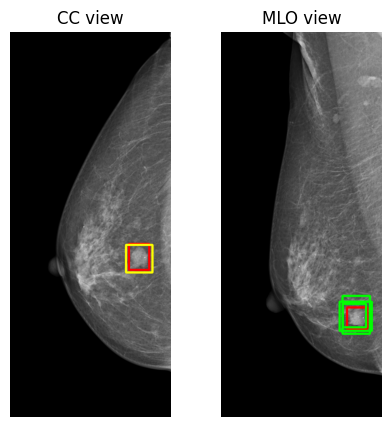

  1%|██▏                                                                                                                                                                                                                                                                              | 16/2000 [00:37<1:06:43,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0004, 0.0004], grad_fn=<TopkBackward0>)
tensor([108,  25,   6])
tensor([[350.2746, 888.6401, 401.4745, 930.8549],
        [342.2179, 883.5761, 409.9461, 938.5721],
        [354.3899, 882.8730, 404.6911, 943.9330]])


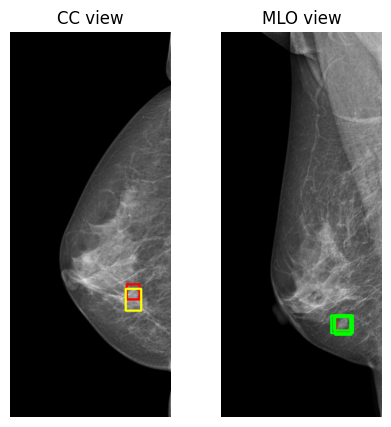

  1%|███▊                                                                                                                                                                                                                                                                             | 28/2000 [01:01<1:04:19,  1.96s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([  1, 164,   4])
tensor([[197.4958, 496.1779, 247.8402, 552.3737],
        [195.3702, 503.6262, 244.9819, 537.4684],
        [202.4764, 495.0026, 246.2702, 542.6323]])


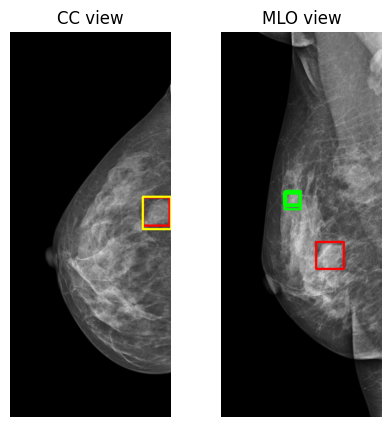

  2%|████                                                                                                                                                                                                                                                                             | 30/2000 [01:05<1:06:53,  2.04s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0003, 0.0003], grad_fn=<TopkBackward0>)
tensor([ 3,  1, 13])
tensor([[209.0991, 766.6302, 294.9135, 865.1132],
        [213.5032, 769.3457, 281.8261, 839.5836],
        [202.8608, 778.5037, 298.2327, 848.9750]])


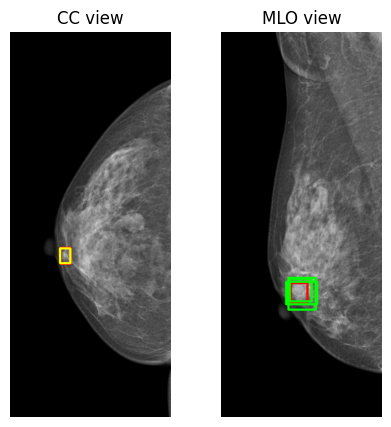

  2%|██████▋                                                                                                                                                                                                                                                                          | 49/2000 [01:42<1:03:39,  1.96s/it]

torch.Size([8, 1000, 1000])
tensor([6.4235e-05, 6.3807e-05, 4.7438e-05], grad_fn=<TopkBackward0>)
tensor([  1,  27, 461])
tensor([[228.6424, 746.7599, 272.7260, 792.4771],
        [326.1146, 825.1017, 484.9634, 921.2282],
        [273.5435, 509.4669, 289.0671, 525.6985]])


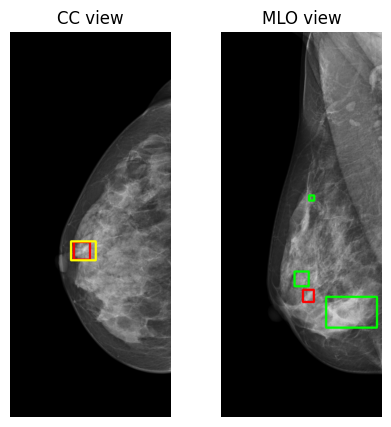

  4%|██████████▉                                                                                                                                                                                                                                                                      | 80/2000 [02:45<1:04:47,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([3.7272e-05, 2.7379e-05, 2.2416e-05], grad_fn=<TopkBackward0>)
tensor([953, 178, 935])
tensor([[ 157.0396,  860.5135,  405.1503, 1180.1039],
        [ 304.4566,    0.0000,  500.0000,  329.2717],
        [ 158.0873,    0.0000,  412.0233,  118.3797]])


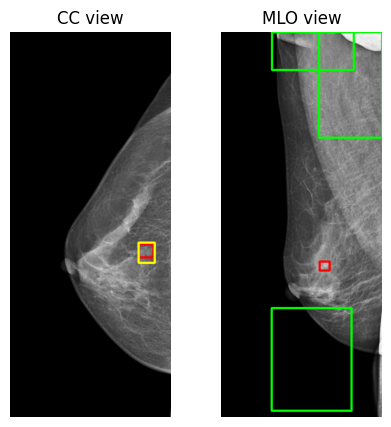

  6%|█████████████████▎                                                                                                                                                                                                                                                              | 127/2000 [04:20<1:00:59,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0012, 0.0007, 0.0006], grad_fn=<TopkBackward0>)
tensor([1, 3, 5])
tensor([[254.9566, 528.6464, 404.2929, 707.0309],
        [273.3308, 551.2492, 394.8383, 686.2955],
        [268.2963, 540.6660, 390.2979, 730.9662]])


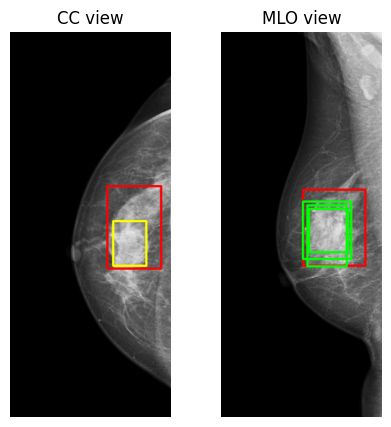

  6%|█████████████████▌                                                                                                                                                                                                                                                              | 129/2000 [04:24<1:02:38,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0003, 0.0003], grad_fn=<TopkBackward0>)
tensor([ 2, 33,  5])
tensor([[367.6137, 846.3465, 488.2214, 968.7050],
        [367.0504, 825.0380, 472.3674, 991.8223],
        [386.7802, 835.9012, 476.7829, 982.2725]])


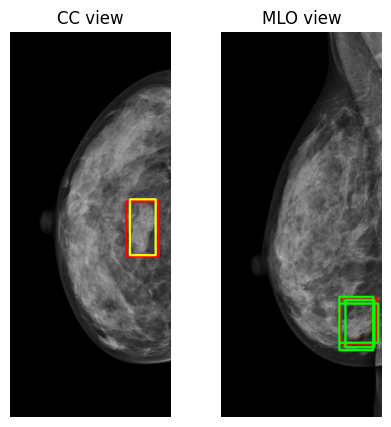

  7%|██████████████████▍                                                                                                                                                                                                                                                             | 136/2000 [04:38<1:00:34,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0004, 0.0003], grad_fn=<TopkBackward0>)
tensor([ 0, 51,  5])
tensor([[185.0630, 541.8310, 251.5223, 621.0787],
        [196.4335, 524.8405, 251.9546, 636.3301],
        [194.1055, 533.0779, 258.1722, 615.8195]])


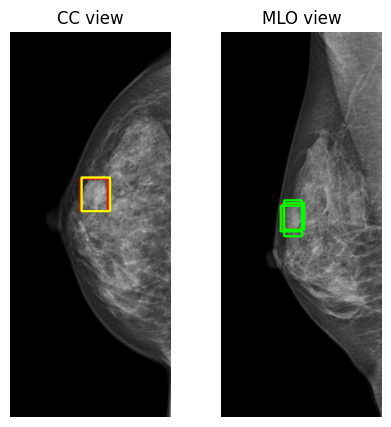

  8%|███████████████████████                                                                                                                                                                                                                                                         | 170/2000 [05:45<1:01:27,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([1.0989e-04, 1.0821e-04, 8.6668e-05], grad_fn=<TopkBackward0>)
tensor([  0, 160,   2])
tensor([[187.0583, 680.9843, 335.9139, 830.5888],
        [402.6906, 499.9335, 456.2047, 550.2608],
        [185.6512, 656.8076, 336.6096, 843.6245]])


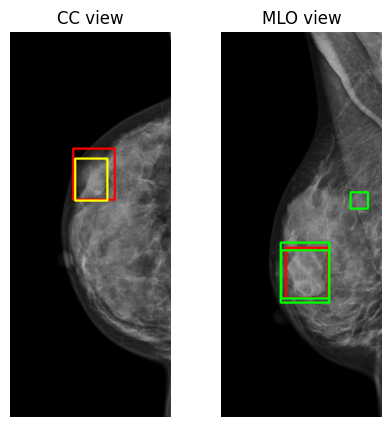

  9%|████████████████████████▉                                                                                                                                                                                                                                                         | 182/2000 [06:09<59:38,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007, 0.0004, 0.0003], grad_fn=<TopkBackward0>)
tensor([ 59, 148,  87])
tensor([[346.2254, 493.0349, 375.7909, 544.1316],
        [339.1438, 498.2576, 388.0376, 545.2901],
        [343.3093, 501.9881, 385.0906, 536.6572]])


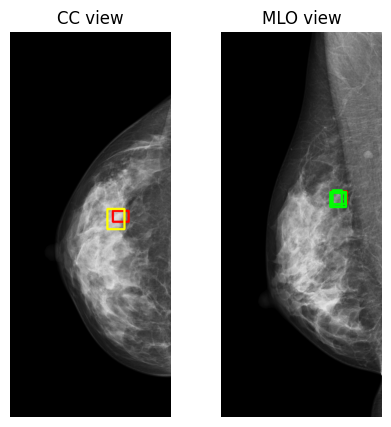

 10%|█████████████████████████▊                                                                                                                                                                                                                                                      | 190/2000 [06:25<1:00:11,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0004, 0.0003], grad_fn=<TopkBackward0>)
tensor([5, 3, 6])
tensor([[393.1754, 690.7278, 500.0000, 827.8685],
        [370.2268, 344.4611, 430.8285, 402.2349],
        [393.6801, 666.5256, 500.0000, 803.0063]])


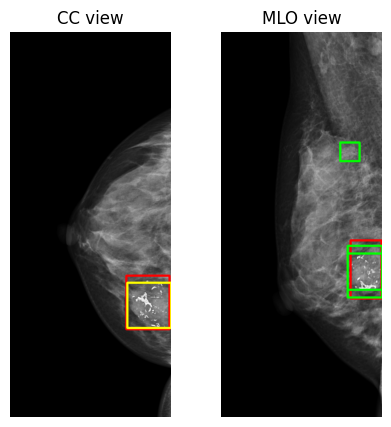

 10%|███████████████████████████▊                                                                                                                                                                                                                                                      | 203/2000 [06:51<59:49,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0002, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([ 2, 22,  1])
tensor([[387.3792, 754.8284, 440.6387, 813.1935],
        [385.5834, 756.1609, 431.4438, 809.4103],
        [385.6949, 764.8774, 431.9792, 818.6430]])


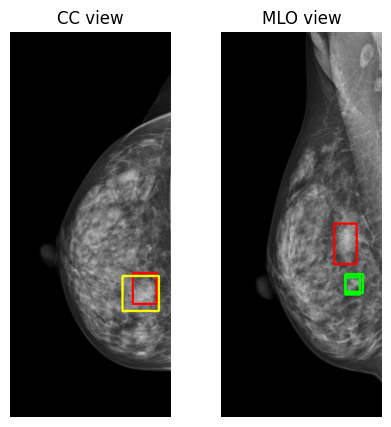

 10%|███████████████████████████▉                                                                                                                                                                                                                                                    | 205/2000 [06:55<1:01:05,  2.04s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0003, 0.0003], grad_fn=<TopkBackward0>)
tensor([20, 24, 18])
tensor([[248.3017, 623.5297, 360.1545, 700.9525],
        [232.9088, 624.2213, 419.2088, 734.4435],
        [239.5951, 617.4709, 386.4185, 714.1976]])


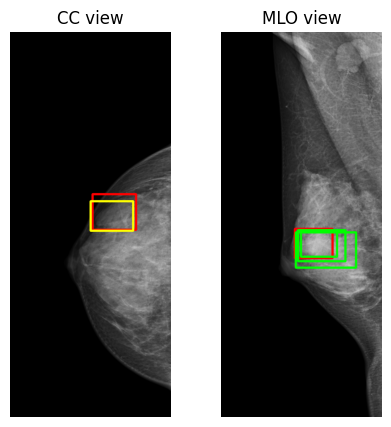

 11%|███████████████████████████████▎                                                                                                                                                                                                                                                  | 229/2000 [07:43<59:22,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([0.0008, 0.0005, 0.0005], grad_fn=<TopkBackward0>)
tensor([19, 86, 10])
tensor([[186.7746, 663.4683, 285.9864, 730.4350],
        [196.8967, 632.3328, 280.4515, 785.2155],
        [182.9546, 639.5997, 289.3428, 751.5002]])


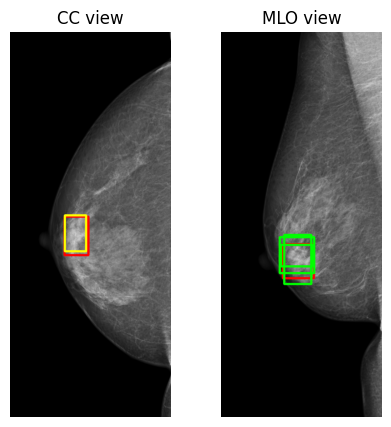

 12%|████████████████████████████████                                                                                                                                                                                                                                                  | 234/2000 [07:53<59:33,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0005, 0.0005], grad_fn=<TopkBackward0>)
tensor([169, 109,  11])
tensor([[153.8907, 639.4213, 186.1657, 695.7326],
        [146.9462, 638.0090, 192.9394, 706.1382],
        [127.3857, 637.4681, 211.3917, 692.0964]])


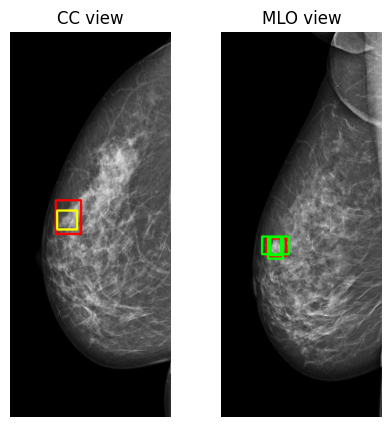

 12%|█████████████████████████████████▉                                                                                                                                                                                                                                                | 248/2000 [08:22<58:20,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0008, 0.0005, 0.0005], grad_fn=<TopkBackward0>)
tensor([ 2,  3, 20])
tensor([[180.3597, 465.4560, 343.3594, 639.5539],
        [179.5929, 446.6958, 354.3982, 630.7700],
        [183.3448, 410.1718, 336.4809, 682.5514]])


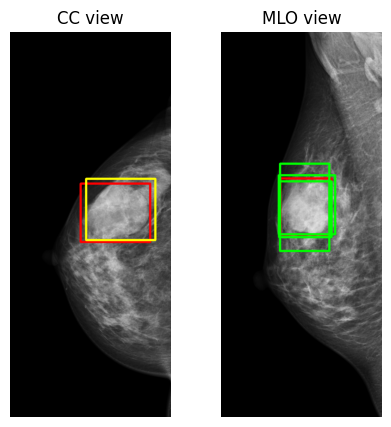

 16%|████████████████████████████████████████████▎                                                                                                                                                                                                                                     | 323/2000 [10:51<55:05,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([ 0, 18,  7])
tensor([[339.9286, 699.3393, 492.2008, 850.2424],
        [287.5703, 726.4711, 353.8566, 801.2063],
        [353.3055, 690.6735, 473.8890, 874.6223]])


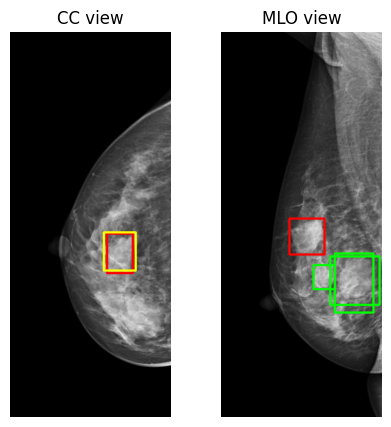

 16%|████████████████████████████████████████████▌                                                                                                                                                                                                                                     | 325/2000 [10:55<56:07,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0004, 0.0003], grad_fn=<TopkBackward0>)
tensor([40,  2, 18])
tensor([[316.6934, 662.5341, 360.0765, 711.9562],
        [317.0431, 657.8991, 364.1211, 712.2903],
        [259.3375, 715.9326, 393.1769, 809.1810]])


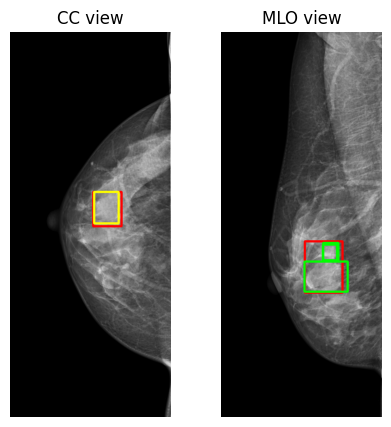

 17%|███████████████████████████████████████████████▏                                                                                                                                                                                                                                  | 344/2000 [11:33<54:53,  1.99s/it]

torch.Size([8, 1000, 1000])
tensor([2.9436e-04, 1.4579e-04, 9.7158e-05], grad_fn=<TopkBackward0>)
tensor([ 2, 20,  1])
tensor([[443.2004, 515.2593, 498.9722, 580.7953],
        [446.4919, 518.2074, 494.3173, 570.8254],
        [451.7355, 504.9044, 492.8050, 594.4489]])


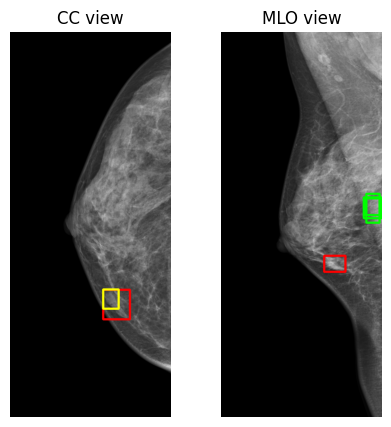

torch.Size([8, 1000, 1000])
tensor([4.9008e-05, 3.7595e-05, 3.7542e-05], grad_fn=<TopkBackward0>)
tensor([ 2, 24, 15])
tensor([[443.2004, 515.2593, 498.9722, 580.7953],
        [178.1596, 583.3314, 252.8098, 682.0592],
        [175.2148, 583.5405, 253.7289, 681.0012]])


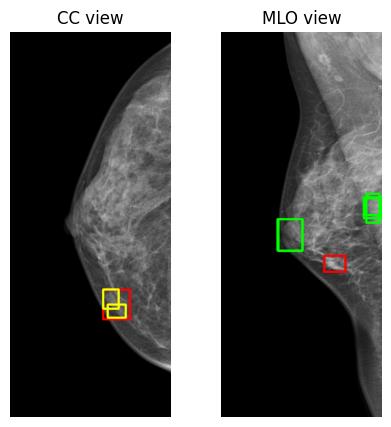

 17%|███████████████████████████████████████████████▌                                                                                                                                                                                                                                  | 347/2000 [11:39<57:13,  2.08s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0003, 0.0002], grad_fn=<TopkBackward0>)
tensor([3, 5, 7])
tensor([[180.4015, 831.0696, 239.1176, 898.6549],
        [167.1616, 824.1326, 235.0291, 890.8345],
        [170.9762, 836.4289, 235.8723, 906.5622]])


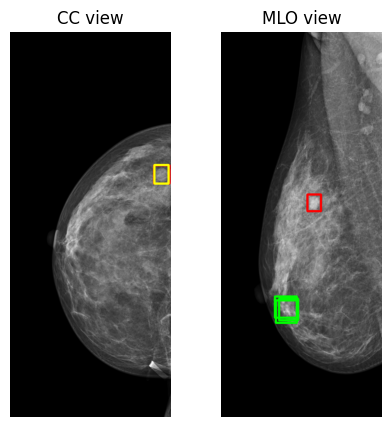

 18%|█████████████████████████████████████████████████▊                                                                                                                                                                                                                                | 364/2000 [12:13<53:06,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0008, 0.0006, 0.0004], grad_fn=<TopkBackward0>)
tensor([129,   2,   6])
tensor([[287.7863, 677.6577, 387.0488, 848.6842],
        [277.9233, 693.0064, 382.9325, 827.4108],
        [294.9609, 658.7192, 391.3404, 817.8135]])


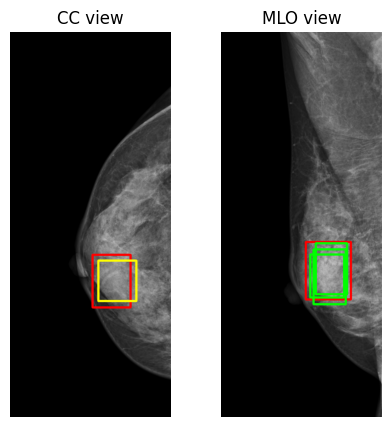

 20%|██████████████████████████████████████████████████████▉                                                                                                                                                                                                                           | 401/2000 [13:27<51:51,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0011, 0.0007, 0.0007], grad_fn=<TopkBackward0>)
tensor([8, 2, 1])
tensor([[314.8710, 563.8282, 426.7130, 640.5142],
        [331.0914, 566.7560, 412.6110, 638.5842],
        [318.6840, 558.5611, 414.6562, 659.5540]])


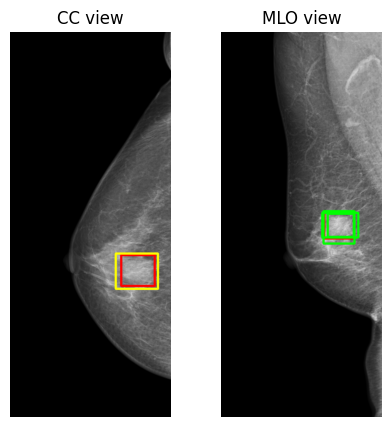

 21%|█████████████████████████████████████████████████████████▊                                                                                                                                                                                                                        | 422/2000 [14:08<51:31,  1.96s/it]

torch.Size([8, 1000, 1000])
tensor([0.0013, 0.0006, 0.0005], grad_fn=<TopkBackward0>)
tensor([73, 28,  2])
tensor([[201.8744, 411.1717, 313.0216, 653.0380],
        [167.9513, 384.8174, 326.4286, 672.8138],
        [184.5004, 506.4814, 301.6022, 626.8881]])


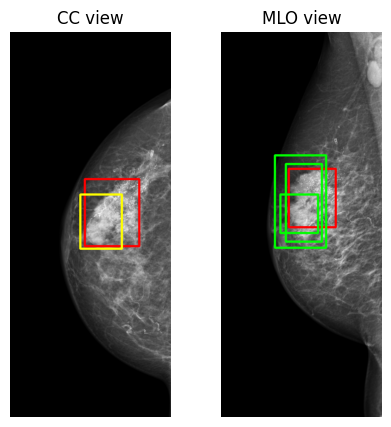

 22%|█████████████████████████████████████████████████████████████▏                                                                                                                                                                                                                    | 447/2000 [14:58<51:00,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0003, 0.0002], grad_fn=<TopkBackward0>)
tensor([248,  15,  64])
tensor([[190.3098, 664.5142, 222.6152, 700.1179],
        [251.8617, 484.2019, 311.3401, 556.5409],
        [257.7353, 506.8563, 304.5399, 533.0186]])


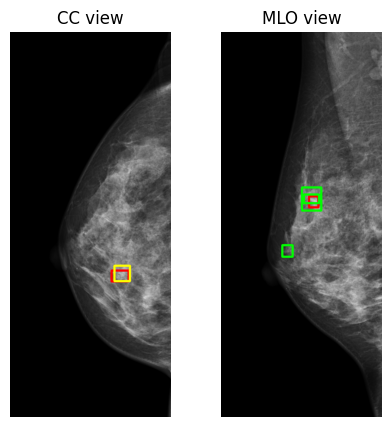

 23%|████████████████████████████████████████████████████████████████▎                                                                                                                                                                                                                 | 469/2000 [15:41<50:47,  1.99s/it]

torch.Size([8, 1000, 1000])
tensor([0.0010, 0.0006, 0.0006], grad_fn=<TopkBackward0>)
tensor([ 0, 14, 23])
tensor([[344.3343, 575.8916, 406.9576, 639.3876],
        [327.9715, 575.7812, 415.3431, 647.4552],
        [338.0741, 577.4451, 422.4128, 632.8625]])


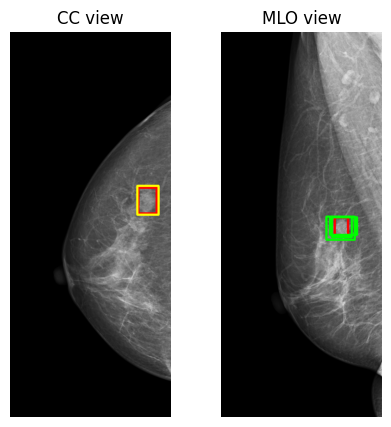

 24%|█████████████████████████████████████████████████████████████████▍                                                                                                                                                                                                                | 478/2000 [15:59<51:01,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007, 0.0004, 0.0003], grad_fn=<TopkBackward0>)
tensor([ 1, 11,  5])
tensor([[225.3325, 566.1564, 324.2380, 674.6746],
        [207.8744, 577.3522, 332.0966, 668.1980],
        [234.0283, 578.2305, 323.2410, 673.4340]])


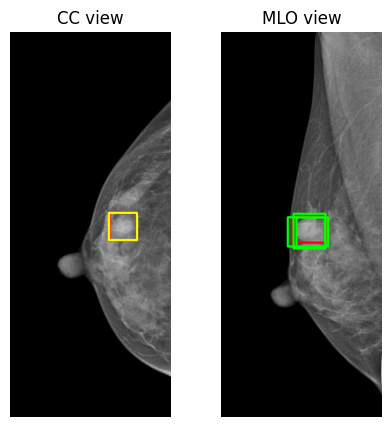

 24%|██████████████████████████████████████████████████████████████████▉                                                                                                                                                                                                               | 489/2000 [16:21<49:52,  1.98s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006, 0.0006, 0.0006], grad_fn=<TopkBackward0>)
tensor([17, 16, 62])
tensor([[310.3885, 631.7172, 403.9911, 711.9388],
        [269.2045, 630.6685, 413.7914, 713.1905],
        [214.8095, 710.9204, 264.9994, 765.2859]])


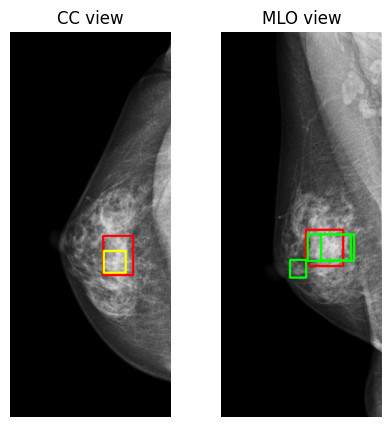

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([17, 16, 38])
tensor([[310.3885, 631.7172, 403.9911, 711.9388],
        [269.2045, 630.6685, 413.7914, 713.1905],
        [183.2498, 707.2015, 277.0403, 765.4050]])


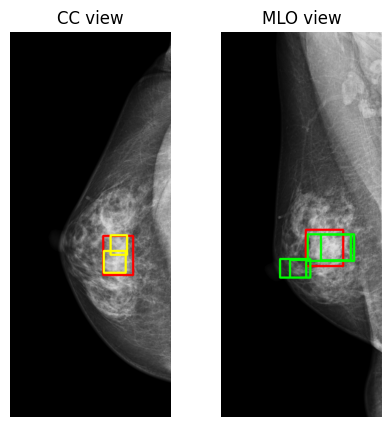

 28%|███████████████████████████████████████████████████████████████████████████▌                                                                                                                                                                                                      | 552/2000 [18:27<48:29,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([7.4414e-06, 6.2000e-06, 6.1947e-06], grad_fn=<TopkBackward0>)
tensor([918, 710, 871])
tensor([[349.4162, 728.8166, 379.6908, 752.3565],
        [322.3965, 816.3305, 344.7913, 835.8859],
        [452.5528,   0.0000, 470.5860,  19.8067]])


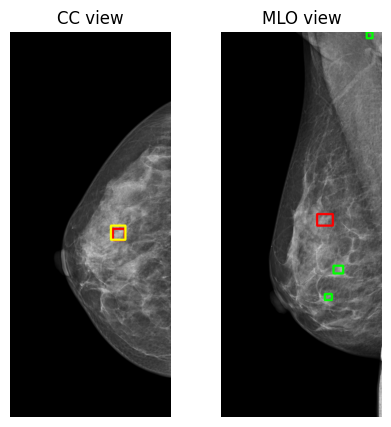

 29%|███████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                                                  | 582/2000 [19:27<46:31,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0015, 0.0011, 0.0009], grad_fn=<TopkBackward0>)
tensor([ 0,  4, 79])
tensor([[303.9553, 425.3970, 354.0619, 484.4374],
        [307.6127, 426.4499, 344.6852, 475.3003],
        [303.1718, 433.2948, 353.0147, 469.6047]])


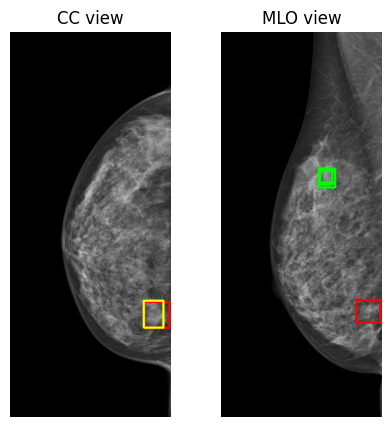

 30%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                                                                | 597/2000 [19:57<46:42,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0003, 0.0003], grad_fn=<TopkBackward0>)
tensor([90,  8, 19])
tensor([[345.5641, 767.0838, 435.3282, 844.7462],
        [361.3111, 769.6112, 419.2034, 855.8567],
        [352.7772, 772.5181, 447.2319, 837.4759]])


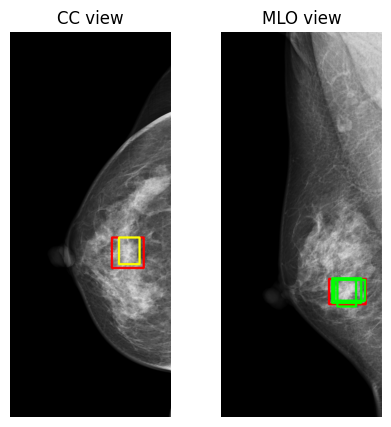

 33%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                                                        | 651/2000 [21:45<44:34,  1.98s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0004, 0.0003], grad_fn=<TopkBackward0>)
tensor([22,  5,  9])
tensor([[224.8004, 760.2198, 323.3434, 821.5196],
        [276.7785, 497.8243, 331.3643, 573.6456],
        [256.4319, 492.4120, 350.3266, 564.8959]])


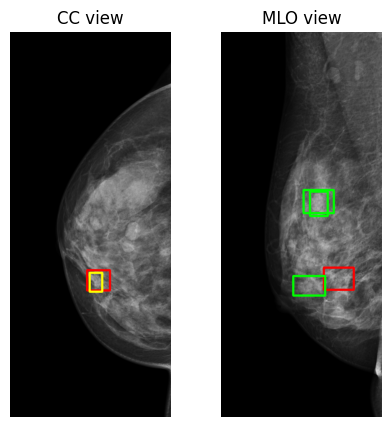

 35%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                                                   | 692/2000 [23:07<44:12,  2.03s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0004, 0.0003], grad_fn=<TopkBackward0>)
tensor([  0,  50, 114])
tensor([[375.1394, 549.8214, 436.8247, 621.2247],
        [384.8690, 561.7335, 435.3029, 615.1915],
        [394.4638, 772.4879, 423.8853, 820.5305]])


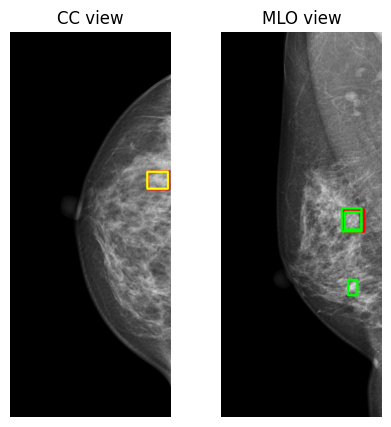

 35%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                                 | 708/2000 [23:39<43:39,  2.03s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0003, 0.0003], grad_fn=<TopkBackward0>)
tensor([0, 3, 1])
tensor([[416.1676, 632.4069, 500.0000, 738.0241],
        [420.4490, 622.8083, 500.0000, 716.1097],
        [418.4193, 614.6420, 500.0000, 720.5056]])


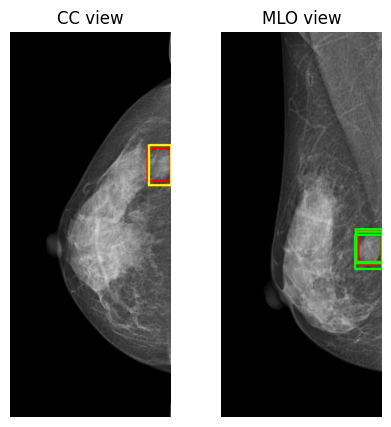

 39%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                      | 783/2000 [26:11<41:25,  2.04s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([ 3, 49, 36])
tensor([[342.5590, 484.1457, 439.0094, 577.1867],
        [342.8099, 488.1630, 453.3268, 559.0057],
        [328.1539, 493.5376, 436.2231, 566.7050]])


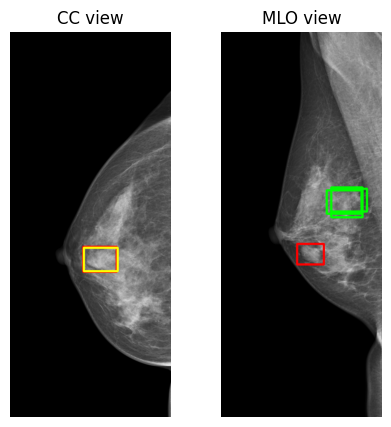

 40%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                     | 791/2000 [26:28<40:34,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([0.0012, 0.0009, 0.0008], grad_fn=<TopkBackward0>)
tensor([ 0,  3, 20])
tensor([[303.8630, 552.0967, 413.4023, 657.8812],
        [311.3077, 532.0405, 410.5620, 675.8965],
        [299.5998, 564.9829, 404.8368, 643.9741]])


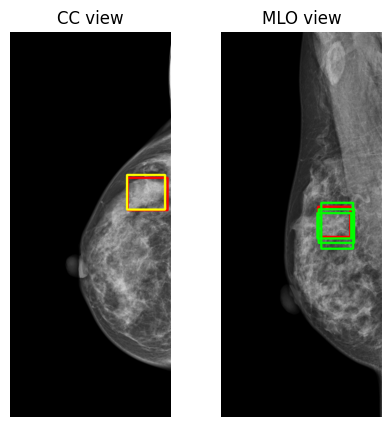

 43%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                            | 860/2000 [28:46<37:53,  1.99s/it]

torch.Size([8, 1000, 1000])
tensor([0.0002, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([20, 19, 11])
tensor([[347.3170, 431.6778, 436.7712, 497.9301],
        [439.2856, 887.4431, 487.6052, 941.7152],
        [343.1856, 425.9235, 434.5697, 509.3951]])


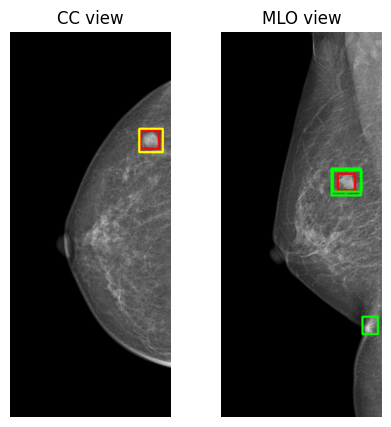

 43%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                            | 862/2000 [28:50<38:30,  2.03s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0003, 0.0003], grad_fn=<TopkBackward0>)
tensor([5, 4, 8])
tensor([[ 332.1640,  895.6931,  428.6799,  987.9448],
        [ 341.9461,  885.1210,  434.2463, 1006.4489],
        [ 331.4751,  895.5532,  437.9589,  993.5415]])


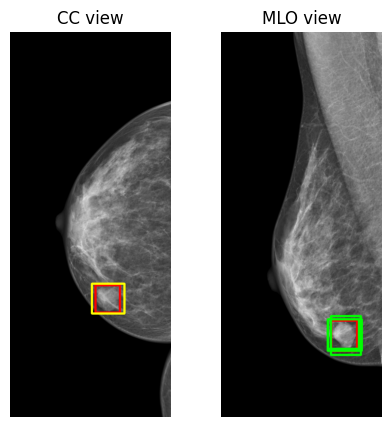

 44%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                         | 883/2000 [29:32<37:09,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([18,  0,  2])
tensor([[335.0267, 631.7932, 459.4092, 836.6639],
        [318.3413, 654.5682, 454.7752, 818.6223],
        [316.6757, 643.5760, 476.0560, 834.6720]])


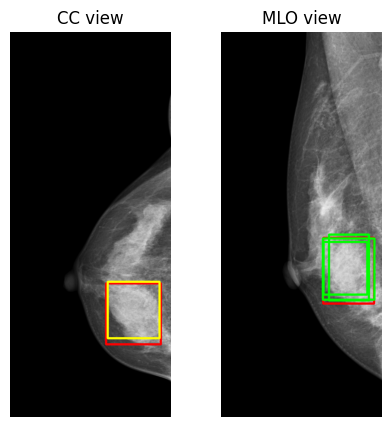

 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                    | 916/2000 [30:39<36:16,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([0.0011, 0.0010, 0.0009], grad_fn=<TopkBackward0>)
tensor([0, 2, 1])
tensor([[190.5201, 605.6268, 232.1376, 653.0220],
        [195.3438, 604.4324, 229.4847, 652.0965],
        [184.4962, 596.1257, 236.1781, 651.5912]])


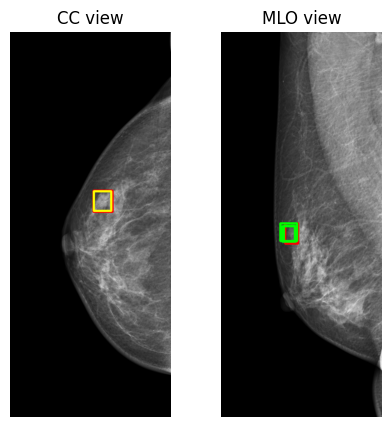

 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                | 944/2000 [31:35<34:52,  1.98s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006, 0.0005, 0.0005], grad_fn=<TopkBackward0>)
tensor([7, 0, 1])
tensor([[382.7579, 760.0817, 423.2791, 793.3693],
        [389.1427, 753.2393, 423.8406, 794.6505],
        [378.6506, 753.9152, 424.4455, 795.1779]])


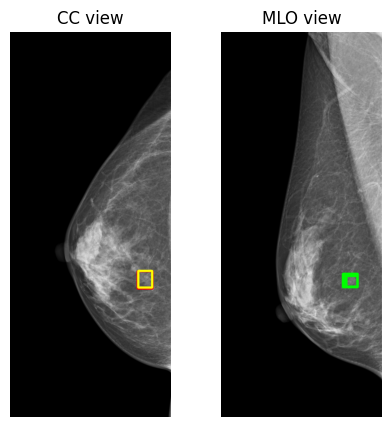

 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                               | 957/2000 [32:01<34:19,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006, 0.0004, 0.0003], grad_fn=<TopkBackward0>)
tensor([ 1, 13,  3])
tensor([[349.5386, 397.5563, 424.8358, 472.3437],
        [327.6444, 407.4572, 442.4530, 479.3338],
        [360.6839, 387.9577, 427.8214, 480.0349]])


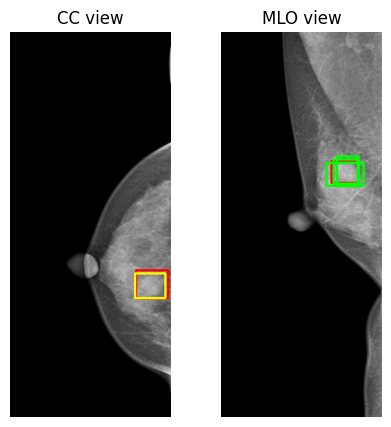

 49%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                          | 987/2000 [33:00<33:36,  1.99s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0004, 0.0003], grad_fn=<TopkBackward0>)
tensor([17,  0, 12])
tensor([[338.3904, 731.3005, 459.6487, 826.3326],
        [351.8040, 730.7177, 457.7256, 824.9684],
        [362.4932, 714.4882, 464.2991, 819.9393]])


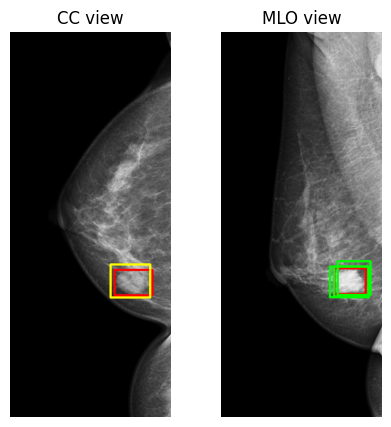

 50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                         | 999/2000 [33:24<33:09,  1.99s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([15,  1, 67])
tensor([[250.5269, 718.5953, 357.5188, 777.7081],
        [263.9219, 718.6688, 339.1366, 778.6602],
        [253.7770, 729.7812, 343.0378, 777.4754]])


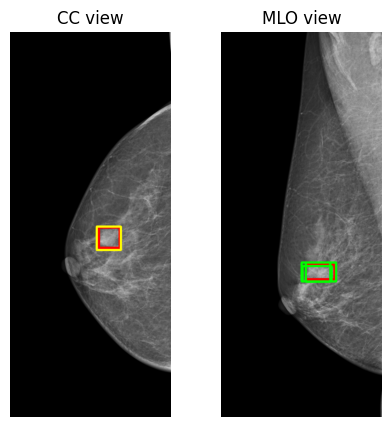

 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 1029/2000 [34:24<31:50,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0005, 0.0002], grad_fn=<TopkBackward0>)
tensor([2, 6, 1])
tensor([[276.0904, 872.2348, 358.6837, 937.4316],
        [272.6146, 864.4021, 354.9341, 935.9877],
        [290.2831, 864.3695, 363.2961, 934.2711]])


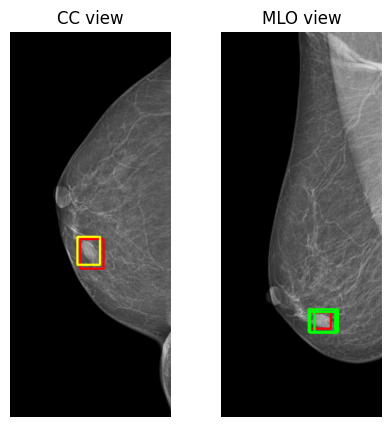

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                    | 1031/2000 [34:28<32:22,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0004, 0.0003], grad_fn=<TopkBackward0>)
tensor([ 3, 23,  1])
tensor([[242.6542, 366.8040, 434.7629, 564.1720],
        [218.4046, 391.8835, 429.7336, 499.7570],
        [243.0134, 362.6920, 402.1348, 510.8612]])


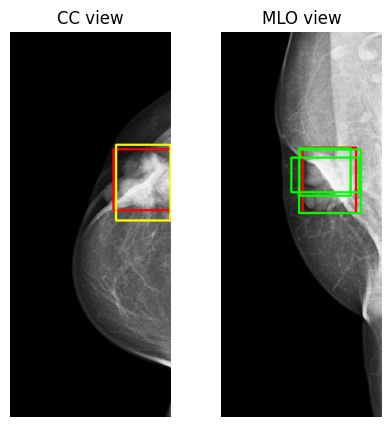

 52%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                  | 1043/2000 [34:52<31:02,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0003, 0.0002], grad_fn=<TopkBackward0>)
tensor([ 0,  1, 38])
tensor([[216.6598, 774.2643, 282.6716, 828.9269],
        [221.9758, 766.6036, 287.9049, 823.8149],
        [217.0181, 763.7766, 282.4446, 839.2148]])


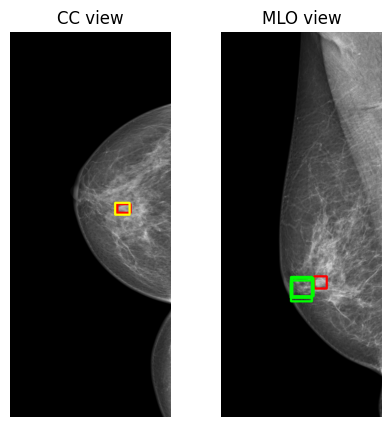

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                              | 1077/2000 [35:59<30:51,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([0.0009, 0.0004, 0.0004], grad_fn=<TopkBackward0>)
tensor([8, 4, 2])
tensor([[371.8101, 589.0032, 500.0000, 870.9747],
        [385.5831, 633.4263, 496.9390, 816.7706],
        [366.8444, 638.5161, 500.0000, 827.0835]])


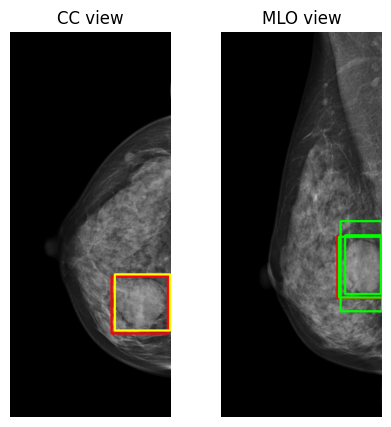

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                          | 1104/2000 [36:52<29:43,  1.99s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0004, 0.0003], grad_fn=<TopkBackward0>)
tensor([24,  1,  3])
tensor([[309.9348, 671.8032, 376.5378, 770.4171],
        [297.6664, 681.9673, 382.3825, 765.0681],
        [291.4224, 680.3376, 382.5969, 764.9444]])


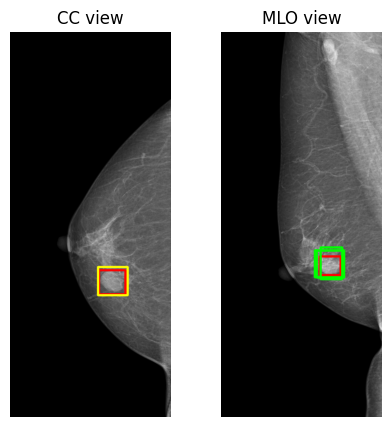

 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                    | 1144/2000 [38:11<28:29,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0008, 0.0008, 0.0005], grad_fn=<TopkBackward0>)
tensor([38,  0,  9])
tensor([[272.1357, 439.4443, 337.1956, 542.3010],
        [249.7641, 445.3716, 347.2403, 563.1286],
        [268.1814, 461.5933, 329.5451, 557.9509]])


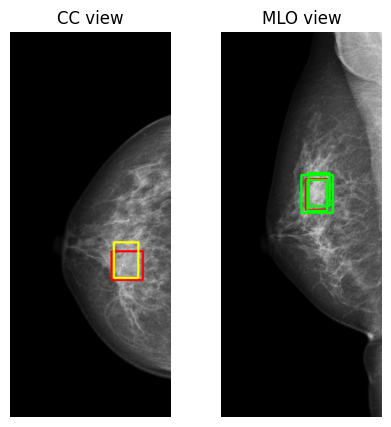

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                   | 1153/2000 [38:29<27:56,  1.98s/it]

torch.Size([8, 1000, 1000])
tensor([0.0015, 0.0013, 0.0012], grad_fn=<TopkBackward0>)
tensor([ 0,  2, 15])
tensor([[353.4857, 851.7253, 405.5376, 900.4644],
        [357.2653, 845.4622, 401.5524, 900.4464],
        [345.6209, 849.1245, 420.5661, 900.5380]])


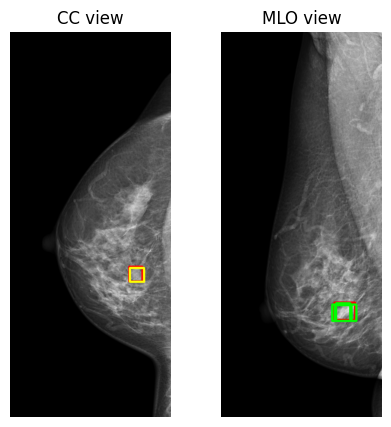

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                              | 1191/2000 [39:45<26:42,  1.98s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007, 0.0005, 0.0005], grad_fn=<TopkBackward0>)
tensor([0, 2, 8])
tensor([[273.7151, 648.3229, 385.1985, 772.6875],
        [278.4771, 623.6528, 391.6263, 798.7043],
        [256.9561, 627.8640, 394.7874, 791.1014]])


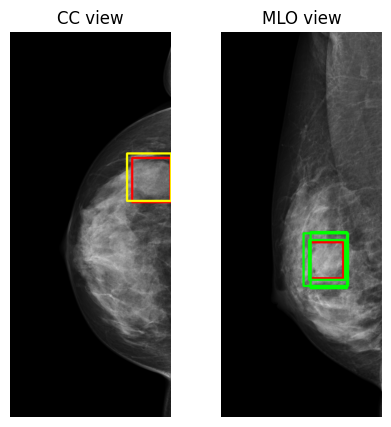

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                           | 1213/2000 [40:28<25:14,  1.92s/it]

torch.Size([8, 1000, 1000])
tensor([0.0010, 0.0008, 0.0007], grad_fn=<TopkBackward0>)
tensor([0, 2, 6])
tensor([[294.0508, 531.6172, 362.4773, 594.3463],
        [295.9539, 518.8683, 371.4320, 601.9822],
        [295.2619, 523.2010, 379.7298, 606.1989]])


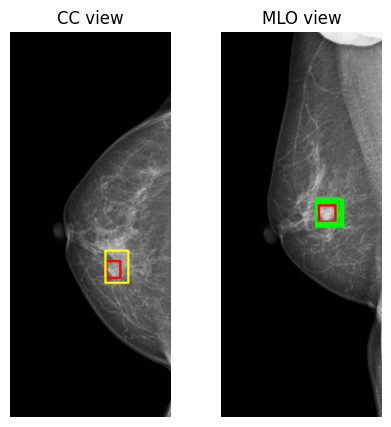

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 1220/2000 [40:42<25:24,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0004, 0.0002], grad_fn=<TopkBackward0>)
tensor([19,  2,  0])
tensor([[209.6723, 389.3483, 380.3490, 685.3010],
        [171.2548, 412.1801, 379.3601, 655.0052],
        [194.0754, 443.3027, 398.0991, 673.6978]])


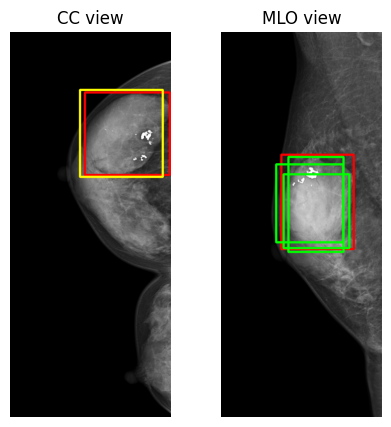

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                       | 1243/2000 [41:27<24:32,  1.94s/it]

torch.Size([8, 1000, 1000])
tensor([0.0013, 0.0011, 0.0007], grad_fn=<TopkBackward0>)
tensor([16,  0, 18])
tensor([[203.8952, 647.4206, 301.7393, 792.1221],
        [191.0995, 633.1205, 315.7722, 781.4611],
        [202.3837, 618.0601, 310.1246, 778.3276]])


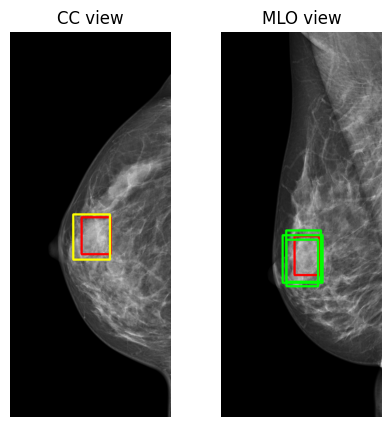

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 1256/2000 [41:53<24:26,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0005, 0.0004], grad_fn=<TopkBackward0>)
tensor([ 0, 28, 25])
tensor([[244.1292, 428.6272, 314.4200, 504.3327],
        [225.5898, 433.1068, 343.0263, 508.0133],
        [307.5239, 900.4130, 345.8699, 946.1268]])


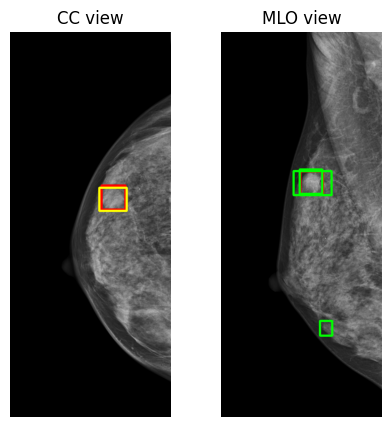

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                     | 1258/2000 [41:57<24:47,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0009, 0.0006, 0.0005], grad_fn=<TopkBackward0>)
tensor([  0, 120, 370])
tensor([[421.6945, 793.1824, 484.1480, 853.1937],
        [410.9772, 753.5292, 452.6913, 802.1949],
        [403.6143, 757.6539, 453.6007, 792.9639]])


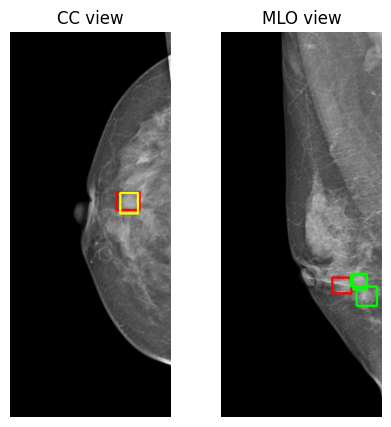

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                    | 1265/2000 [42:11<24:06,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0011, 0.0009, 0.0004], grad_fn=<TopkBackward0>)
tensor([13,  0, 12])
tensor([[213.9786, 415.3464, 305.2096, 476.1484],
        [230.9206, 413.0133, 296.3734, 486.4372],
        [217.0378, 414.7899, 297.9337, 503.0234]])


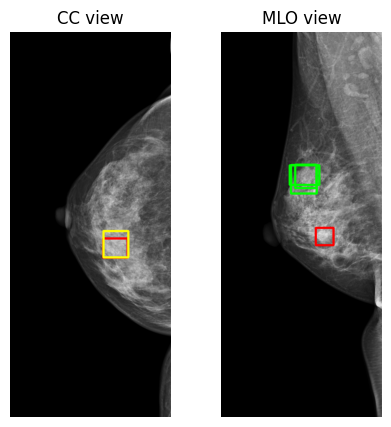

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                | 1293/2000 [43:07<23:31,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007, 0.0006, 0.0006], grad_fn=<TopkBackward0>)
tensor([34,  2, 22])
tensor([[357.5898, 552.3079, 436.3081, 611.3317],
        [362.1038, 536.9789, 438.1282, 618.3941],
        [337.7953, 545.0501, 438.9009, 608.8185]])


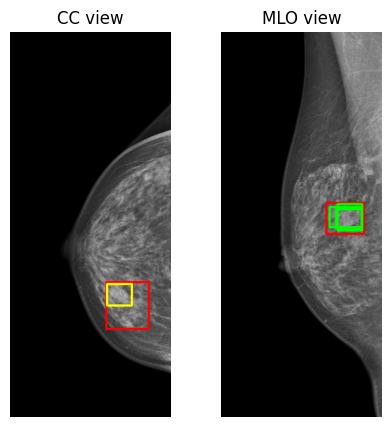

torch.Size([8, 1000, 1000])
tensor([3.9197e-05, 3.9099e-05, 3.7571e-05], grad_fn=<TopkBackward0>)
tensor([ 2, 34, 22])
tensor([[362.1038, 536.9789, 438.1282, 618.3941],
        [357.5898, 552.3079, 436.3081, 611.3317],
        [337.7953, 545.0501, 438.9009, 608.8185]])


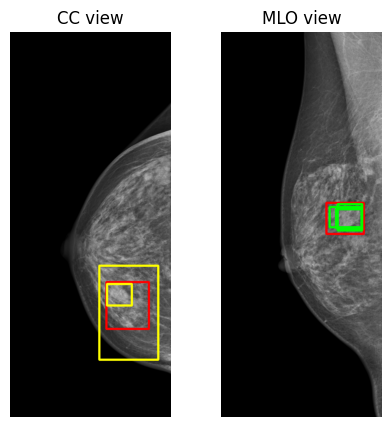

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                              | 1309/2000 [43:38<22:40,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0003, 0.0003], grad_fn=<TopkBackward0>)
tensor([2, 0, 1])
tensor([[339.5868, 578.8591, 380.7522, 624.8219],
        [335.2230, 576.1697, 381.1668, 627.5732],
        [334.5427, 566.1766, 388.8240, 625.9888]])


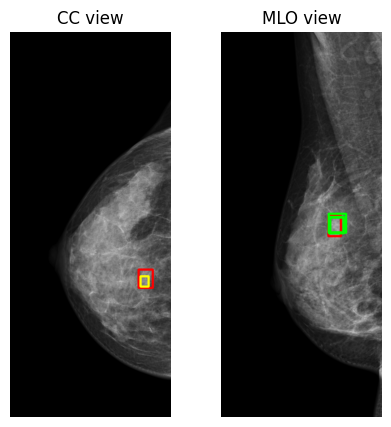

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 1416/2000 [47:10<18:55,  1.94s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0005, 0.0003], grad_fn=<TopkBackward0>)
tensor([763,  30,   1])
tensor([[344.3801, 757.6176, 411.0286, 797.2510],
        [350.9174, 753.7269, 393.7315, 800.3831],
        [453.7726, 264.5545, 489.1290, 306.6308]])


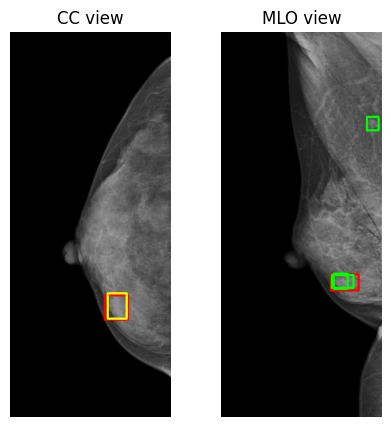

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 1431/2000 [47:40<18:42,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0003, 0.0003], grad_fn=<TopkBackward0>)
tensor([0, 1, 9])
tensor([[266.1877, 473.2415, 381.3238, 590.0017],
        [286.1868, 457.6887, 374.0579, 599.5497],
        [251.2574, 475.3912, 407.5300, 583.7001]])


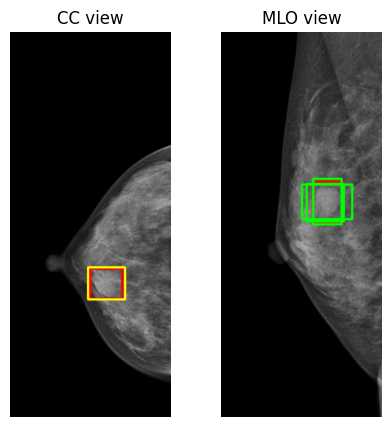

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 1451/2000 [48:20<18:20,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0012, 0.0007, 0.0006], grad_fn=<TopkBackward0>)
tensor([1, 2, 5])
tensor([[405.6630, 747.9637, 456.0734, 800.0645],
        [407.9743, 752.2195, 445.6100, 795.0042],
        [402.9172, 737.5380, 457.1301, 810.3619]])


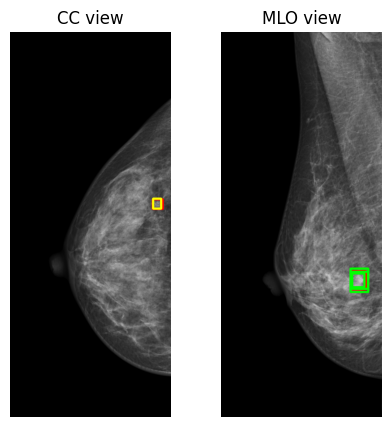

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 1468/2000 [48:54<17:41,  1.99s/it]

torch.Size([8, 1000, 1000])
tensor([0.0008, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([ 1, 84, 30])
tensor([[ 367.4731,  910.0580,  500.0000, 1037.3248],
        [ 374.6169,  882.1700,  500.0000, 1031.9656],
        [ 370.6743,  883.4498,  473.5116, 1037.5209]])


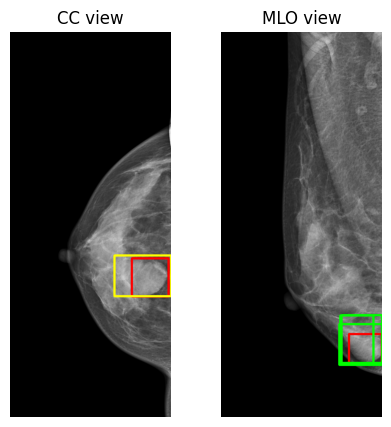

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 1528/2000 [50:54<15:45,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([1.5637e-04, 1.4056e-04, 8.6115e-05], grad_fn=<TopkBackward0>)
tensor([ 0,  3, 44])
tensor([[192.0957, 534.6168, 391.1275, 776.7925],
        [197.4314, 502.8625, 401.8274, 735.6224],
        [202.1182, 572.0275, 419.5709, 697.1249]])


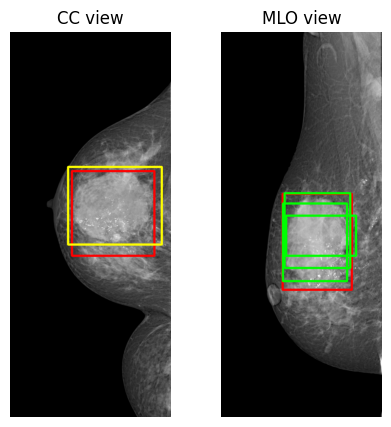

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 1529/2000 [50:56<16:14,  2.07s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0005, 0.0004], grad_fn=<TopkBackward0>)
tensor([  1,   7, 968])
tensor([[308.1273, 550.2075, 381.4413, 628.9194],
        [304.4234, 499.2733, 393.8163, 645.9217],
        [311.3619, 523.0357, 381.3068, 636.9890]])


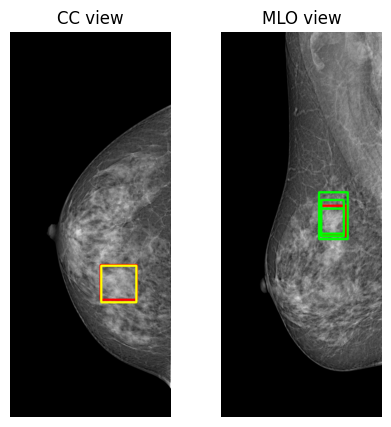

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 1532/2000 [51:02<15:43,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006, 0.0005, 0.0004], grad_fn=<TopkBackward0>)
tensor([ 5,  1, 12])
tensor([[337.0332, 886.9670, 402.9423, 971.4380],
        [327.3926, 492.8318, 403.3484, 564.0792],
        [335.0010, 483.2091, 408.0330, 571.8929]])


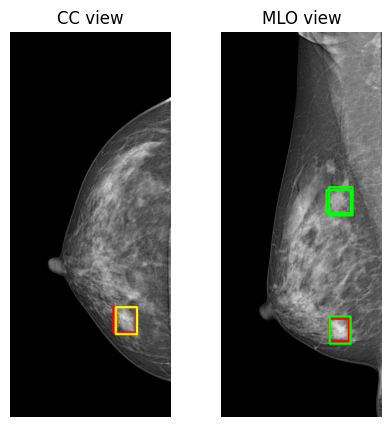

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 1537/2000 [51:13<15:38,  2.03s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007, 0.0006, 0.0005], grad_fn=<TopkBackward0>)
tensor([ 3,  6, 10])
tensor([[265.0569, 591.2461, 372.9100, 756.7433],
        [247.9881, 591.5133, 356.7354, 768.4484],
        [238.7536, 621.7304, 401.8809, 726.3524]])


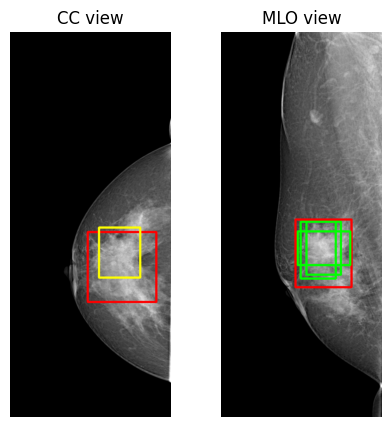

torch.Size([8, 1000, 1000])
tensor([4.2439e-05, 4.0622e-05, 3.6416e-05], grad_fn=<TopkBackward0>)
tensor([ 3,  6, 10])
tensor([[265.0569, 591.2461, 372.9100, 756.7433],
        [247.9881, 591.5133, 356.7354, 768.4484],
        [238.7536, 621.7304, 401.8809, 726.3524]])


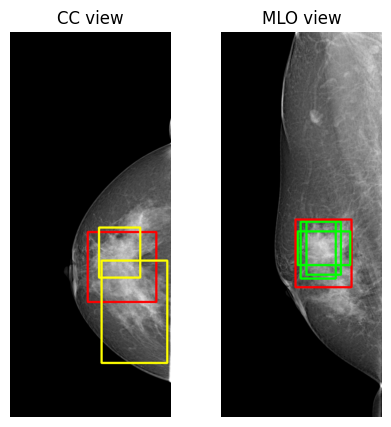

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 1540/2000 [51:19<15:45,  2.05s/it]

torch.Size([8, 1000, 1000])
tensor([0.0010, 0.0004, 0.0003], grad_fn=<TopkBackward0>)
tensor([1, 0, 2])
tensor([[204.3749, 631.0761, 320.0273, 745.8919],
        [221.0067, 641.9366, 334.0801, 758.1716],
        [224.7244, 608.1420, 334.4552, 771.9471]])


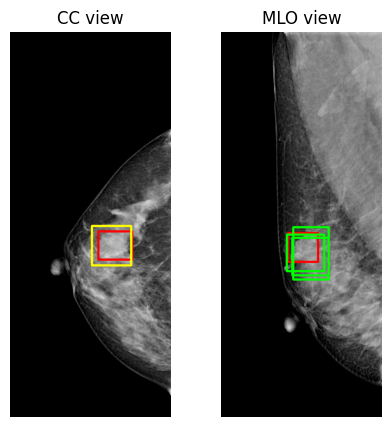

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 1578/2000 [52:34<13:53,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0002, 0.0001, 0.0001], grad_fn=<TopkBackward0>)
tensor([ 1, 19,  3])
tensor([[254.3637, 929.1005, 311.2216, 989.9271],
        [341.5155, 443.1563, 398.0744, 531.4724],
        [262.6826, 938.0524, 314.8954, 992.8825]])


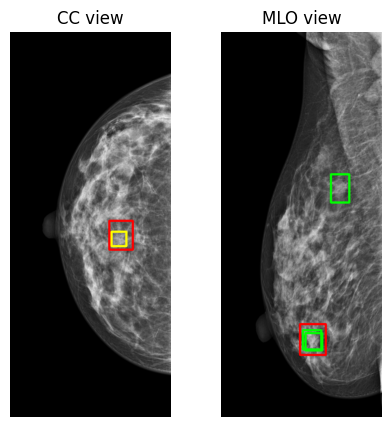

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 1604/2000 [53:25<12:49,  1.94s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007, 0.0007, 0.0005], grad_fn=<TopkBackward0>)
tensor([ 2,  5, 28])
tensor([[384.9289, 632.8984, 428.6142, 679.2393],
        [204.6821, 790.2213, 277.0294, 870.2054],
        [389.7216, 625.6367, 422.2049, 678.6219]])


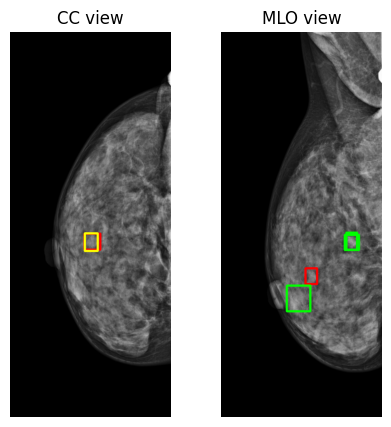

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 1631/2000 [54:18<11:57,  1.94s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0003, 0.0003], grad_fn=<TopkBackward0>)
tensor([ 0, 87, 69])
tensor([[236.6685, 629.4579, 304.8668, 706.5087],
        [363.2353, 763.9780, 401.4192, 803.7089],
        [240.1595, 619.2264, 314.1973, 725.6382]])


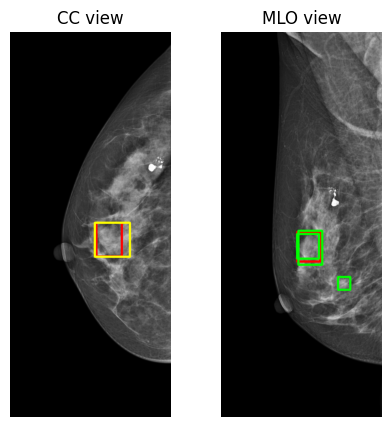

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 1645/2000 [54:46<11:29,  1.94s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0004, 0.0004], grad_fn=<TopkBackward0>)
tensor([10, 23,  4])
tensor([[302.9462, 797.7853, 364.3942, 863.0573],
        [299.9765, 793.3588, 359.6804, 877.4073],
        [370.4776, 610.9499, 449.2296, 704.1628]])


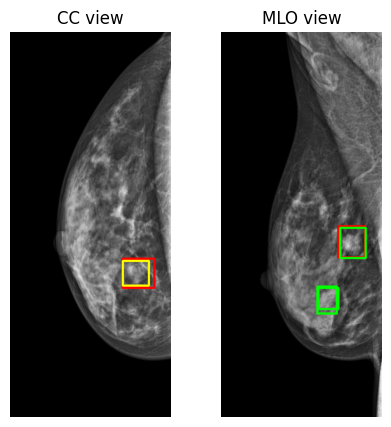

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 1656/2000 [55:07<11:13,  1.96s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0004, 0.0002], grad_fn=<TopkBackward0>)
tensor([  2, 104,   6])
tensor([[423.1854, 837.1197, 500.0000, 986.6884],
        [428.4690, 852.8479, 500.0000, 960.5774],
        [414.5031, 869.3419, 498.3284, 970.2744]])


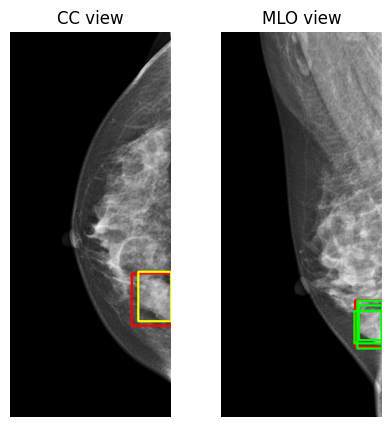

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 1688/2000 [56:10<10:05,  1.94s/it]

torch.Size([8, 1000, 1000])
tensor([0.0008, 0.0006, 0.0006], grad_fn=<TopkBackward0>)
tensor([ 1, 19, 21])
tensor([[289.3043, 449.6295, 414.4394, 574.8476],
        [306.9587, 433.4946, 402.4837, 583.5433],
        [267.6031, 438.7293, 397.6992, 589.1997]])


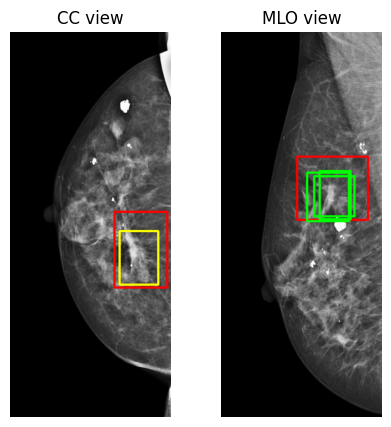

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 1707/2000 [56:47<09:29,  1.94s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004, 0.0004, 0.0004], grad_fn=<TopkBackward0>)
tensor([3, 0, 5])
tensor([[183.2429, 425.1624, 339.2192, 610.0471],
        [188.9061, 452.5791, 327.9935, 602.2565],
        [203.3639, 445.0181, 317.7358, 632.9022]])


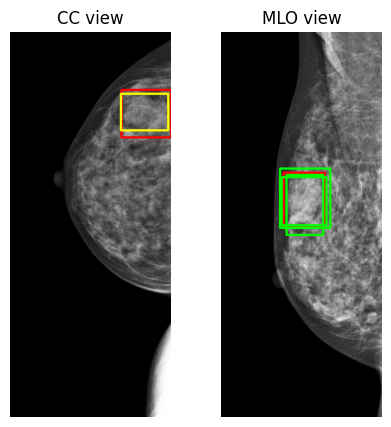

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 1725/2000 [57:23<08:50,  1.93s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005, 0.0003, 0.0003], grad_fn=<TopkBackward0>)
tensor([15, 20,  0])
tensor([[215.3662, 762.3689, 328.2750, 828.6660],
        [220.2027, 766.5978, 341.8943, 837.7545],
        [233.4923, 768.3555, 307.1490, 834.6233]])


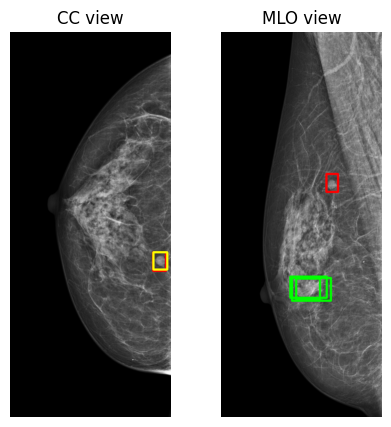

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 1727/2000 [57:27<08:57,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007, 0.0004, 0.0004], grad_fn=<TopkBackward0>)
tensor([ 0,  5, 85])
tensor([[338.4060, 814.2930, 477.3212, 948.6969],
        [312.6677, 827.2793, 489.5670, 942.5295],
        [305.5200, 824.7654, 470.2732, 921.1714]])


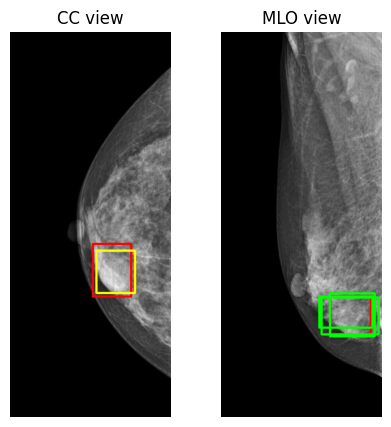

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1733/2000 [57:39<08:41,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0008, 0.0006, 0.0005], grad_fn=<TopkBackward0>)
tensor([11,  2, 18])
tensor([[341.7087, 500.6513, 478.0494, 589.0313],
        [363.5471, 505.5443, 471.4426, 610.5607],
        [342.8122, 510.1424, 465.0123, 591.3525]])


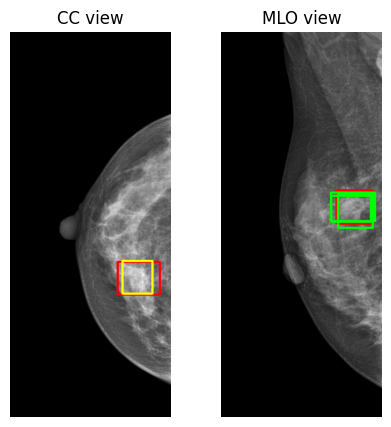

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                               | 1773/2000 [58:58<07:26,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0010, 0.0009, 0.0005], grad_fn=<TopkBackward0>)
tensor([  2,   0, 620])
tensor([[262.0420, 482.2672, 368.8857, 672.3291],
        [239.5116, 502.5119, 366.3190, 649.2920],
        [274.6340, 479.0148, 356.0002, 637.7657]])


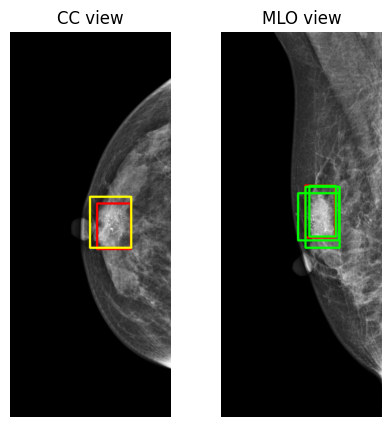

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                              | 1778/2000 [59:08<07:18,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0002, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([1, 2, 3])
tensor([[224.5253, 395.1509, 358.1470, 546.4648],
        [196.1937, 404.0865, 335.0830, 566.7056],
        [215.7383, 380.6788, 375.1474, 556.3157]])


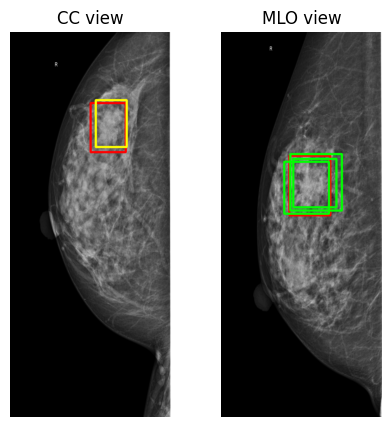

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                            | 1789/2000 [59:29<06:48,  1.93s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0003, 0.0003], grad_fn=<TopkBackward0>)
tensor([0, 5, 7])
tensor([[ 315.2450,  910.9284,  424.6382, 1040.9578],
        [ 275.4122,  893.1296,  436.8726, 1034.0961],
        [ 329.9811,  892.4038,  429.5565, 1052.4020]])


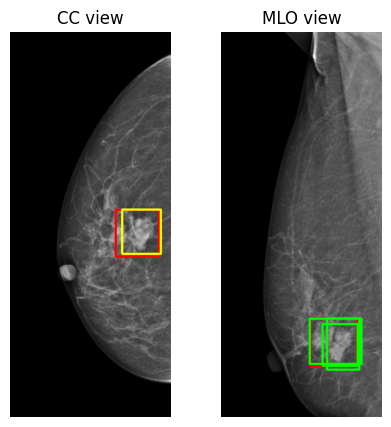

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1828/2000 [1:00:45<05:31,  1.93s/it]

torch.Size([8, 1000, 1000])
tensor([0.0008, 0.0005, 0.0005], grad_fn=<TopkBackward0>)
tensor([1, 2, 6])
tensor([[269.2505, 322.5499, 355.9870, 425.2605],
        [274.9748, 326.0222, 351.1468, 405.8394],
        [272.4707, 317.7983, 337.1355, 416.7370]])


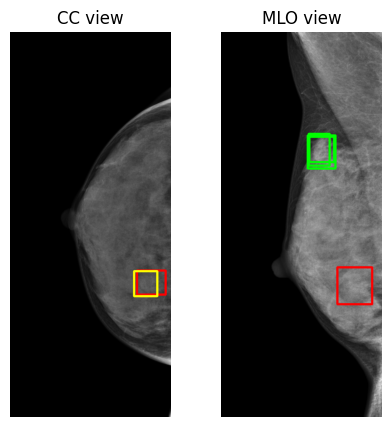

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1837/2000 [1:01:03<05:18,  1.96s/it]

torch.Size([8, 1000, 1000])
tensor([0.0023, 0.0009, 0.0008], grad_fn=<TopkBackward0>)
tensor([ 0, 14,  3])
tensor([[329.3413, 681.0475, 380.1369, 744.0822],
        [335.7854, 670.9927, 386.8070, 753.1575],
        [335.9586, 685.8132, 374.7741, 736.2134]])


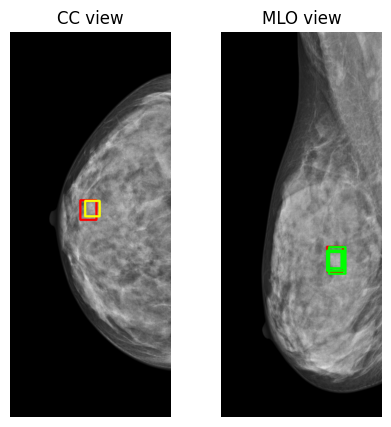

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1935/2000 [1:04:17<02:13,  2.06s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0003, 0.0002], grad_fn=<TopkBackward0>)
tensor([30,  7, 14])
tensor([[253.8638, 487.9803, 392.5880, 687.7926],
        [278.1079, 520.4545, 393.5030, 693.6017],
        [243.9085, 511.4569, 411.4248, 718.2534]])


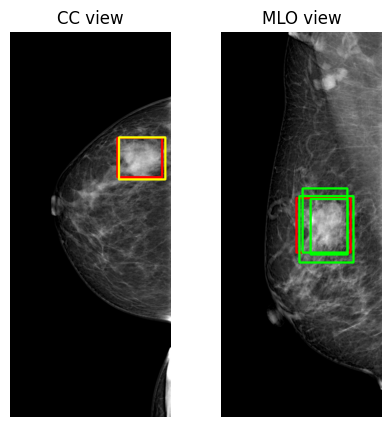

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 1953/2000 [1:04:54<01:37,  2.07s/it]

torch.Size([8, 1000, 1000])
tensor([0.0012, 0.0007, 0.0005], grad_fn=<TopkBackward0>)
tensor([2, 0, 1])
tensor([[234.2511, 568.0228, 406.7020, 753.3442],
        [238.8564, 595.6434, 400.3129, 762.8807],
        [259.1581, 586.4277, 409.8324, 771.8547]])


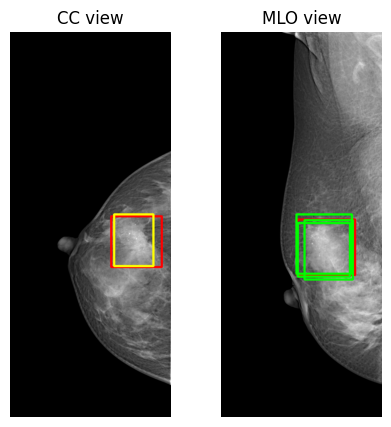

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1956/2000 [1:05:01<01:32,  2.10s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([ 0, 17, 24])
tensor([[354.6582, 425.8299, 469.7848, 530.2775],
        [328.2761, 422.3832, 488.1337, 526.2236],
        [361.6409, 421.6126, 456.8690, 515.3643]])


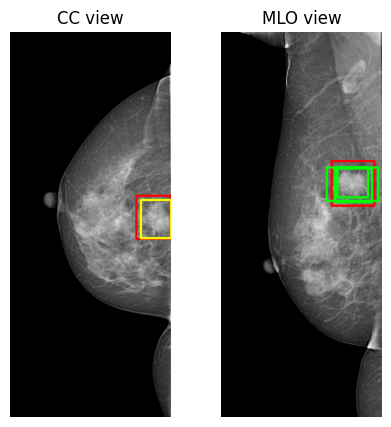

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 1961/2000 [1:05:11<01:20,  2.06s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0002, 0.0002], grad_fn=<TopkBackward0>)
tensor([ 1,  7, 32])
tensor([[346.9756, 301.0638, 471.6163, 437.4657],
        [326.0714, 306.7018, 500.0000, 416.5938],
        [349.7866, 320.1500, 466.6257, 401.8964]])


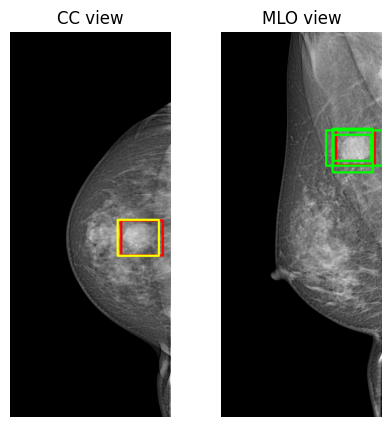

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 1963/2000 [1:05:15<01:17,  2.09s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006, 0.0006, 0.0005], grad_fn=<TopkBackward0>)
tensor([ 5,  0, 18])
tensor([[355.4362, 786.9312, 430.3495, 875.2789],
        [340.4554, 781.1121, 444.0435, 893.9398],
        [328.9571, 786.3674, 461.5896, 876.5172]])


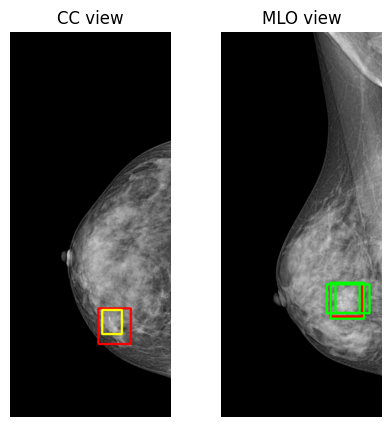

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 1968/2000 [1:05:26<01:07,  2.10s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007, 0.0004, 0.0004], grad_fn=<TopkBackward0>)
tensor([ 1,  5, 26])
tensor([[283.8117, 276.7372, 453.3532, 464.2249],
        [267.0435, 296.3263, 440.9302, 491.5591],
        [272.8315, 257.8253, 409.8853, 485.9573]])


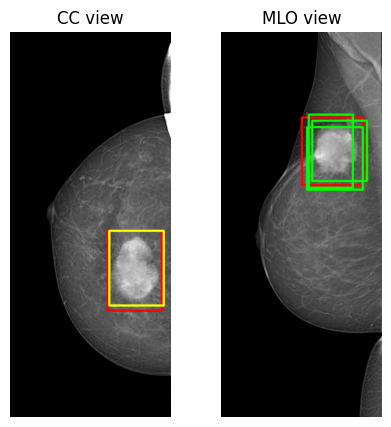

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 1986/2000 [1:06:03<00:26,  1.86s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003, 0.0003, 0.0002], grad_fn=<TopkBackward0>)
tensor([ 0, 33, 35])
tensor([[265.1611, 543.9747, 370.2965, 670.4437],
        [384.2377,  25.1191, 491.3739, 181.6934],
        [370.5804,  19.8826, 474.6560, 173.3371]])


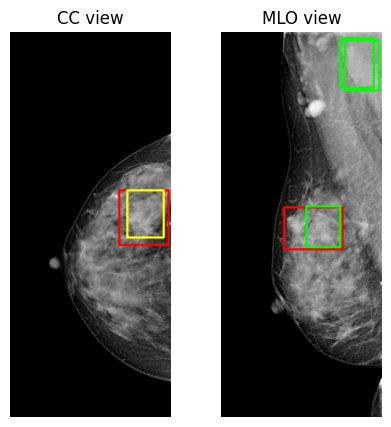

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [1:06:27<00:00,  1.99s/it]

num_data 92
num_data_true 74
num_pred 95
num_true 212
acc 2.231578947368421
recall 0.8043478260869565


In [7]:
device=DEVICE
#model.roi_heads.score_thresh =0.01
num_data= 0
num_pred =0
num_true=0
num_data_true=0
for images_CC, images_MLO, targets_CC, targets_MLO in tqdm(valid_loader):
    images_CC = list(image_CC.to(device) for image_CC in images_CC)
    images_MLO = list(image_MLO.to(device) for image_MLO in images_MLO)
    #images = torch.stack(images)
    #print(images.shape)
    #images = images.to(device)
    targets_CC = [{k: v.to(device) for k, v in t.items()} for t in targets_CC]
    targets_MLO = [{k: v.to(device) for k, v in t.items()} for t in targets_MLO]

    if torch.cuda.is_available():
        torch.cuda.synchronize()
    model_time = time.time()
    outputs_CC, outputs_MLO= model(images_CC, images_MLO, targets_CC, targets_MLO)
        #print('out',outputs)
        #print('tar',targets)
    #####################################
    for i in range(len(images_CC)):
        true_dict_CC = dict()
        true_dict_MLO = dict()
        preds_dict_CC = dict()
        preds_dict_MLO = dict()
        true_dict_CC['boxes'] = targets_CC[i]['boxes']
        true_dict_CC['labels'] = targets_CC[i]['labels']
        preds_dict_CC['boxes'] = outputs_CC[i]['boxes']
        preds_dict_CC['scores'] = outputs_CC[i]['scores']
        preds_dict_CC['labels'] = outputs_CC[i]['labels']
        
        true_dict_MLO['boxes'] = targets_MLO[i]['boxes']
        true_dict_MLO['labels'] = targets_MLO[i]['labels']
        preds_dict_MLO['boxes'] = outputs_MLO[i]['boxes']
        preds_dict_MLO['scores'] = outputs_MLO[i]['scores']
        preds_dict_MLO['labels'] = outputs_MLO[i]['labels']
        img_CC = images_CC[i]
        img_MLO = images_MLO[i]
        
        #img = invTrans(img)[0]
        img_CC= img_CC.permute(1,2,0)
        img_MLO = img_MLO.permute(1,2,0)
        img_CC = img_CC.cpu().numpy().copy()
        img_MLO = img_MLO.cpu().numpy().copy()
        if len(true_dict_MLO['labels']) == 1 and len(true_dict_CC['labels'])==1:
            num_data+=1 
            check= False
            for j in range(len(true_dict_CC['labels'])):
                x_min, y_min, x_max, y_max = true_dict_CC['boxes'][j]
                img_CC =cv2.rectangle(img=img_CC,pt1= (int(x_min),int(y_min)),pt2= (int(x_max),int(y_max)), color = (1.0,0,0),thickness =5)
            for j in range(len(true_dict_MLO['labels'])):
                x_min, y_min, x_max, y_max = true_dict_MLO['boxes'][j]
                img_MLO =cv2.rectangle(img=img_MLO,pt1= (int(x_min),int(y_min)),pt2= (int(x_max),int(y_max)), color = (1.0,0,0),thickness =5)
            for j in range(len(true_dict_CC['labels'])):
                
                for k in range(len(preds_dict_CC['labels'])):
                    if true_dict_CC['labels'][j] == preds_dict_CC['labels'][k]:
                        pred_box= preds_dict_CC['boxes'][k].clone()
                        pred_box[2:] -= pred_box[:2]
                        true_box= true_dict_CC['boxes'][j].clone()
                        true_box[2:]-= true_box[:2]
                        iou_score= get_iou_score(true_box, pred_box)
                        
                        if iou_score>0.2:
                            num_pred+=1
                            model.zero_grad()
                            #preds_dict_CC['scores'][i].backward(retain_graph=True)
                            print(model.roi_heads.crossview.decoder.layers[0][0].attn.shape)
                            grad=torch.autograd.grad(preds_dict_CC['scores'][k], [model.roi_heads.crossview.decoder.layers[0][0].attn], retain_graph=True)[0]
                            index_CC = model.roi_heads.index[i]["CC"][k]
                            cam = model.roi_heads.crossview.decoder.layers[0][0].attn
                            #print(model.roi_heads.crossview.decoder.layers[0][0].tgt2.grad)
                            #grad = model.roi_heads.crossview.decoder.layers[0][0].attn.grad
                            cam = grad*cam
                            cam = cam.clamp(min=0).mean(dim=0)
                            R =cam[index_CC]
                            value, indices = torch.topk(R, 3)
                            print(value)
                            print(indices)
                            print(model.roi_heads.proposals[i]['MLO'][indices])
                            x_min, y_min, x_max, y_max = preds_dict_CC['boxes'][k]
                            img_CC =cv2.rectangle(img=img_CC,pt1= (int(x_min),int(y_min)),pt2= (int(x_max),int(y_max)), color = (1.0,1.0,0),thickness =5)
                            #score =preds_dict_CC['scores'][k]
                            #cv2.putText(img_CC, f'{score}', (int(x_min), int(y_min-10)), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (1.0,1.0,0), 5)
                            
                            for boxes_MLO_pred in model.roi_heads.proposals[i]['MLO'][indices]:
                                x_min, y_min, x_max, y_max = boxes_MLO_pred
                                img_MLO = cv2.rectangle(img=img_MLO,pt1= (int(x_min),int(y_min)),pt2= (int(x_max),int(y_max)), color = (0,1.0,0),thickness =5)
                                boxes_MLO =true_dict_MLO['boxes'][0]
                                pred_box_MLO= boxes_MLO_pred.clone()
                                pred_box_MLO[2:] -= pred_box_MLO[:2]
                                true_box_MLO= boxes_MLO.clone()
                                true_box_MLO[2:]-= true_box_MLO[:2]
                                iou_score= get_iou_score(true_box_MLO, pred_box_MLO)
                                if iou_score>=0.2:
                                    num_true+=1
                                    check= True
                            fig, axs= plt.subplots(1,2,figsize=(5,5))
                            axs[0].imshow(img_CC)
                            axs[0].axis('off')
                            axs[0].set_title("CC view")
                            axs[1].imshow(img_MLO)
                            axs[1].axis('off')
                            axs[1].set_title("MLO view")
                            plt.show()
            if check: 
                num_data_true+=1
print('num_data',num_data)
print('num_data_true',num_data_true)
print('num_pred', num_pred)
print('num_true', num_true)
print('acc', num_true/num_pred)
print('recall', num_data_true/num_data)

In [15]:
print('num_data',num_data)
print('num_data_true',num_data_true)
print('num_pred', num_pred)
print('num_true', num_true)
print('acc', num_true/num_pred*3)
print('recall', num_data_true/num_data)

num_data 92
num_data_true 0
num_pred 97
num_true 0
acc 0.0
recall 0.0


In [8]:
np.linspace(0,1,10)

array([0.        , 0.11111111, 0.22222222, 0.33333333, 0.44444444,
       0.55555556, 0.66666667, 0.77777778, 0.88888889, 1.        ])

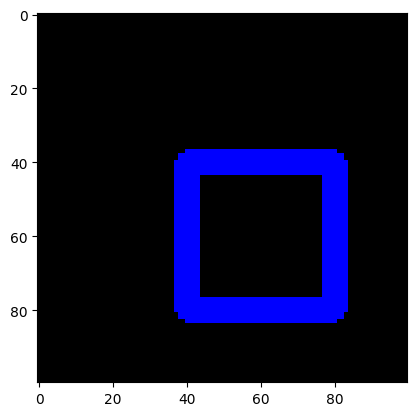

In [9]:
img = np.zeros((100,100,3))
img =cv2.rectangle(img =img,pt1= (40,40),pt2= (80,80), color = (0,0,1.0),thickness =5)
plt.imshow(img)

In [10]:
x=torch.ones(1000).cuda()
x.requires_grad=True
y= torch.ones(1000).cuda()
y.requires_grad=True
z=  (x*y).sum()
x= x.view(5,200)
x.retain_grad()
z.backward()

print(x.grad)

None


In [11]:
torch.__version__

'1.13.1+cu116'

In [12]:
x=1
f'{x}'

'1'

In [13]:
from datasets import create_valid_dataset_multi_mask
valid_dataset_mask = create_valid_dataset_multi_mask(
    VALID_DIR_IMAGES, 
    VALID_DIR_LABELS, 
    IMAGE_SIZE, 
    CLASSES,
    mask=True
)
valid_loader_mask = create_valid_loader(valid_dataset_mask, BATCH_SIZE, NUM_WORKERS)

1000
     index                          study_id  \
0        6  5683854eafabc34f6d854000d2ac6c2d   
1        7  5683854eafabc34f6d854000d2ac6c2d   
2       18  917a4de3b1f921f1c9fa98b7a61d749d   
3       19  917a4de3b1f921f1c9fa98b7a61d749d   
4       20  31fa226bc9f87e0a2cb2de6dddbc2270   
..     ...                               ...   
332   2246  b8acac150be7f949f78dc631a3851f8b   
333   2247  b8acac150be7f949f78dc631a3851f8b   
334   2249  b8acac150be7f949f78dc631a3851f8b   
335   2250  b8acac150be7f949f78dc631a3851f8b   
336   2251  b8acac150be7f949f78dc631a3851f8b   

                             image_id  height  width         xmin  \
0    2f944efb1cb9579442df2d7fe6a579b7    3518   2800   142.899002   
1    7385e8cf7b29764525c81de4aa1aebe4    3518   2800   142.899002   
2    4dd8faf113a9421e03a6e2bcd4238da2    3518   2800   153.445999   
3    19056b152c5d2ed98f66de006fa45a6c    3518   2800   141.677002   
4    625aa350502a7038cfe5f9ca5f1a65f4    3518   2800   192.143005   
..  

  0%|▋                                                                                                                                                                                                                                                                                 | 5/2000 [00:22<1:52:53,  3.40s/it]

torch.Size([8, 1000, 1000])
tensor([0.0001], grad_fn=<TopkBackward0>)
tensor([43])
tensor([[406.3918, 698.2404, 436.5826, 725.4745]])


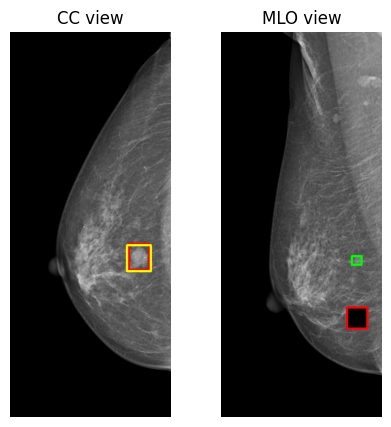

  1%|██▏                                                                                                                                                                                                                                                                              | 16/2000 [00:49<1:10:07,  2.12s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005], grad_fn=<TopkBackward0>)
tensor([3])
tensor([[299.4488, 579.7397, 353.9891, 664.9786]])


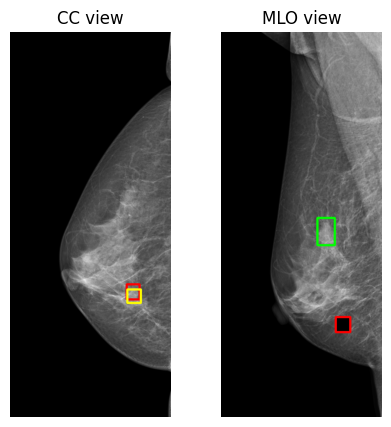

  1%|███▊                                                                                                                                                                                                                                                                             | 28/2000 [01:13<1:06:00,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([163])
tensor([[195.0910, 503.2642, 245.0914, 537.4156]])


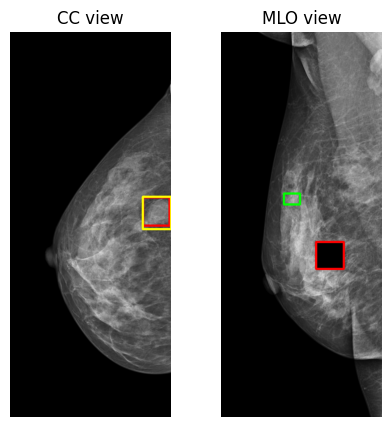

  2%|████                                                                                                                                                                                                                                                                             | 30/2000 [01:17<1:07:03,  2.04s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006], grad_fn=<TopkBackward0>)
tensor([16])
tensor([[334.6920, 877.0576, 388.8413, 967.3918]])


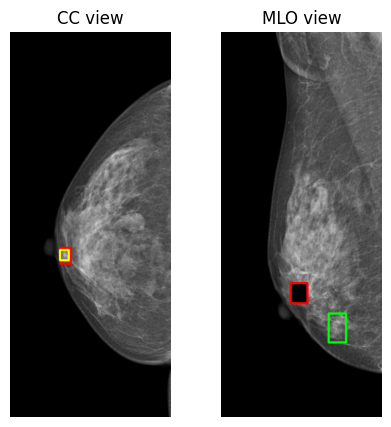

  2%|██████▋                                                                                                                                                                                                                                                                          | 49/2000 [01:58<1:07:05,  2.06s/it]

torch.Size([8, 1000, 1000])
tensor([7.2462e-05], grad_fn=<TopkBackward0>)
tensor([8])
tensor([[341.3879, 788.4616, 471.9277, 922.3692]])


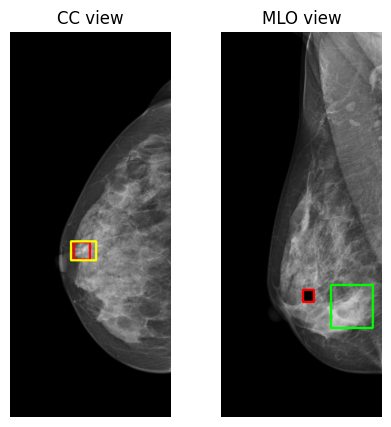

  4%|██████████▉                                                                                                                                                                                                                                                                      | 80/2000 [03:01<1:04:27,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([3.2031e-05], grad_fn=<TopkBackward0>)
tensor([86])
tensor([[304.4562,   0.0000, 500.0000, 329.2722]])


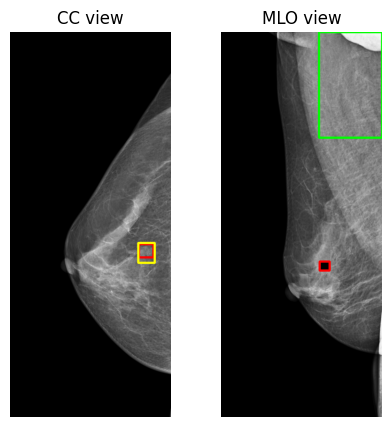

  6%|█████████████████▎                                                                                                                                                                                                                                                              | 127/2000 [04:37<1:04:17,  2.06s/it]

torch.Size([8, 1000, 1000])
tensor([7.1175e-05], grad_fn=<TopkBackward0>)
tensor([705])
tensor([[450.4798, 169.7826, 474.4868, 218.2439]])


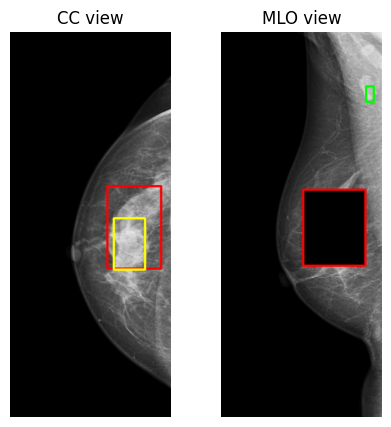

torch.Size([8, 1000, 1000])
tensor([7.2752e-06], grad_fn=<TopkBackward0>)
tensor([163])
tensor([[ 260.2250, 1107.7263,  428.1225, 1200.0000]])


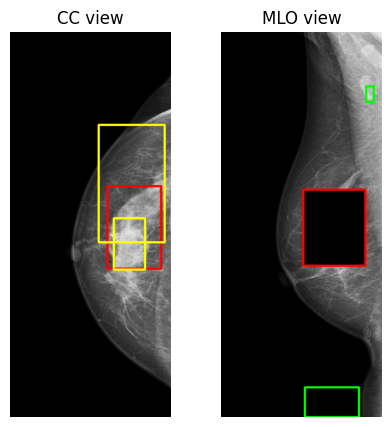

  6%|█████████████████▌                                                                                                                                                                                                                                                              | 129/2000 [04:42<1:07:52,  2.18s/it]

torch.Size([8, 1000, 1000])
tensor([0.0002], grad_fn=<TopkBackward0>)
tensor([6])
tensor([[307.9976, 830.6689, 351.8634, 875.4026]])


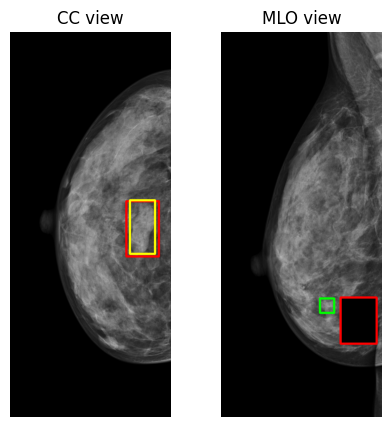

  7%|██████████████████▍                                                                                                                                                                                                                                                             | 136/2000 [04:56<1:04:12,  2.07s/it]

torch.Size([8, 1000, 1000])
tensor([3.5416e-05], grad_fn=<TopkBackward0>)
tensor([580])
tensor([[285.3456, 668.7180, 299.6676, 682.7633]])


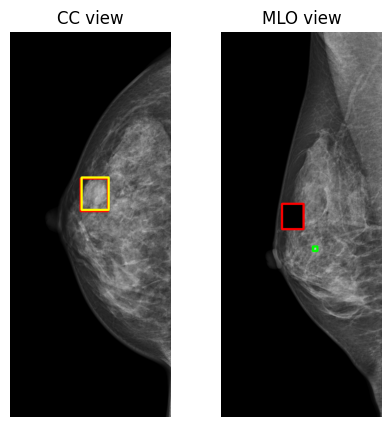

  8%|███████████████████████                                                                                                                                                                                                                                                         | 170/2000 [06:06<1:01:29,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005], grad_fn=<TopkBackward0>)
tensor([8])
tensor([[196.2732, 605.3017, 246.4279, 675.9161]])


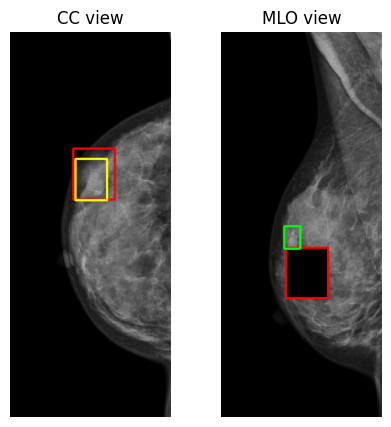

  9%|████████████████████████▊                                                                                                                                                                                                                                                       | 182/2000 [06:30<1:02:41,  2.07s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([15])
tensor([[270.5310, 816.4061, 364.9856, 872.8245]])


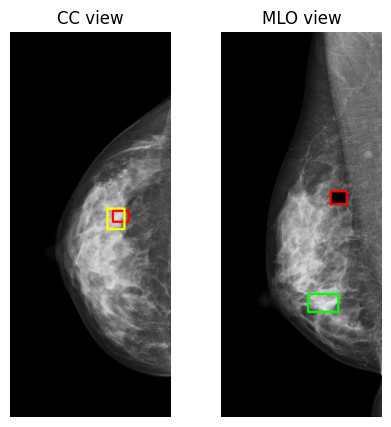

 10%|█████████████████████████▊                                                                                                                                                                                                                                                      | 190/2000 [06:47<1:01:05,  2.03s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006], grad_fn=<TopkBackward0>)
tensor([3])
tensor([[370.2867, 344.4669, 430.8383, 402.1591]])


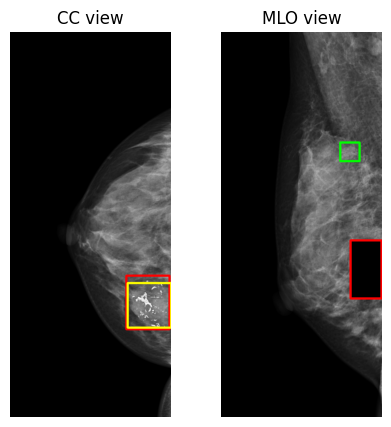

 10%|███████████████████████████▌                                                                                                                                                                                                                                                    | 203/2000 [07:13<1:00:48,  2.03s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([14])
tensor([[386.0862, 754.3753, 432.0078, 809.6208]])


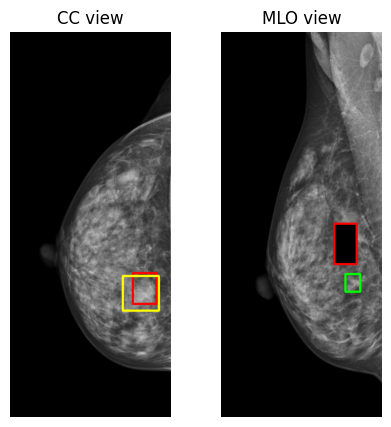

 10%|███████████████████████████▉                                                                                                                                                                                                                                                    | 205/2000 [07:18<1:01:36,  2.06s/it]

torch.Size([8, 1000, 1000])
tensor([8.4498e-05], grad_fn=<TopkBackward0>)
tensor([961])
tensor([[237.5930, 417.3424, 357.0395, 627.4752]])


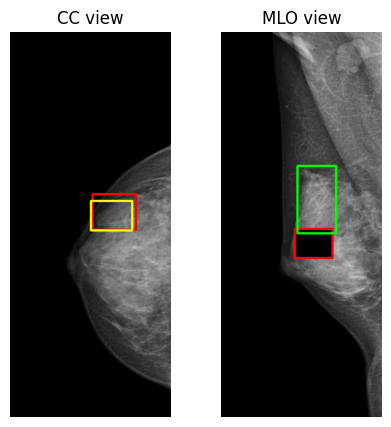

 11%|███████████████████████████████▎                                                                                                                                                                                                                                                  | 229/2000 [08:05<58:55,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([5.0183e-05], grad_fn=<TopkBackward0>)
tensor([388])
tensor([[190.4462, 624.5511, 214.0058, 660.4315]])


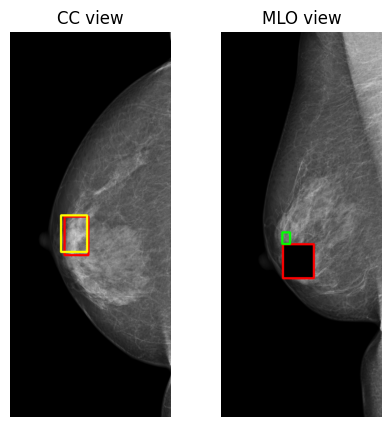

 12%|███████████████████████████████▊                                                                                                                                                                                                                                                | 234/2000 [08:16<1:00:35,  2.06s/it]

torch.Size([8, 1000, 1000])
tensor([6.7951e-05], grad_fn=<TopkBackward0>)
tensor([777])
tensor([[354.0123, 336.2295, 371.5438, 351.9411]])


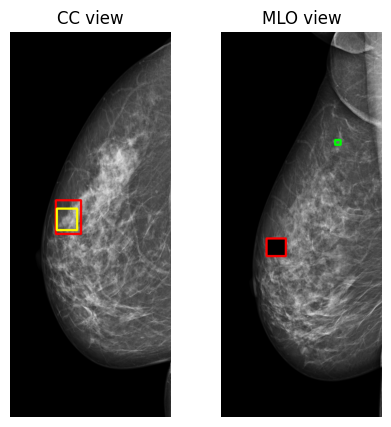

 12%|█████████████████████████████████▉                                                                                                                                                                                                                                                | 248/2000 [08:44<58:56,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([0.0005], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[241.5805, 626.8394, 303.0804, 683.0158]])


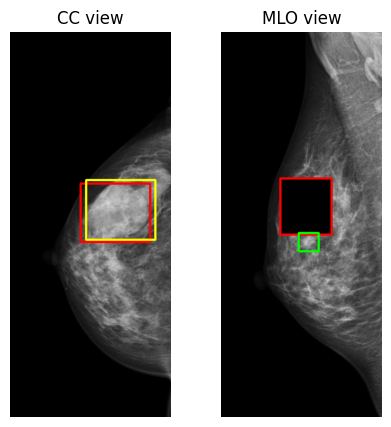

 16%|████████████████████████████████████████████▎                                                                                                                                                                                                                                     | 323/2000 [11:17<56:00,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[340.3133, 699.7169, 491.8581, 850.0264]])


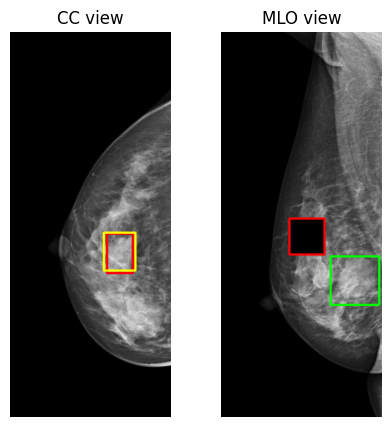

 16%|████████████████████████████████████████████▌                                                                                                                                                                                                                                     | 325/2000 [11:21<59:17,  2.12s/it]

torch.Size([8, 1000, 1000])
tensor([0.0002], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[440.8292, 631.1077, 499.9690, 692.8315]])


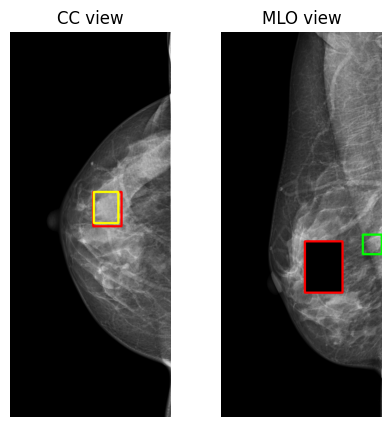

 17%|███████████████████████████████████████████████▏                                                                                                                                                                                                                                  | 344/2000 [12:00<55:19,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([2])
tensor([[443.3875, 515.4611, 499.1870, 580.9872]])


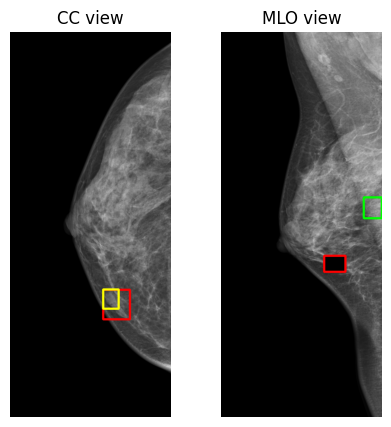

torch.Size([8, 1000, 1000])
tensor([5.2226e-05], grad_fn=<TopkBackward0>)
tensor([2])
tensor([[443.3875, 515.4611, 499.1870, 580.9872]])


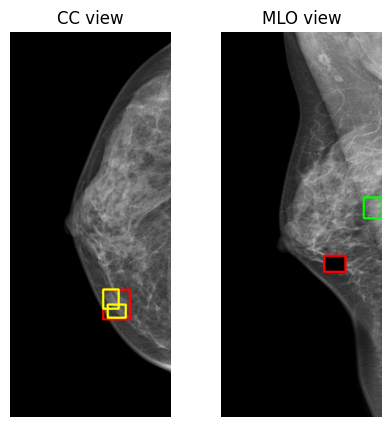

 17%|███████████████████████████████████████████████▌                                                                                                                                                                                                                                  | 347/2000 [12:06<57:17,  2.08s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[180.4098, 831.0392, 239.1366, 898.7047]])


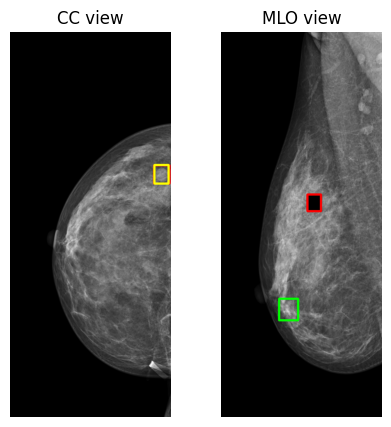

 18%|█████████████████████████████████████████████████▊                                                                                                                                                                                                                                | 364/2000 [12:41<54:45,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004], grad_fn=<TopkBackward0>)
tensor([5])
tensor([[419.2778, 643.0981, 466.5411, 709.4778]])


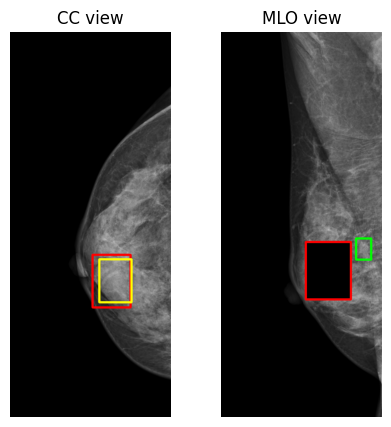

 20%|██████████████████████████████████████████████████████▉                                                                                                                                                                                                                           | 401/2000 [13:56<53:22,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([4.6938e-05], grad_fn=<TopkBackward0>)
tensor([630])
tensor([[468.3055, 459.8549, 480.5797, 479.5891]])


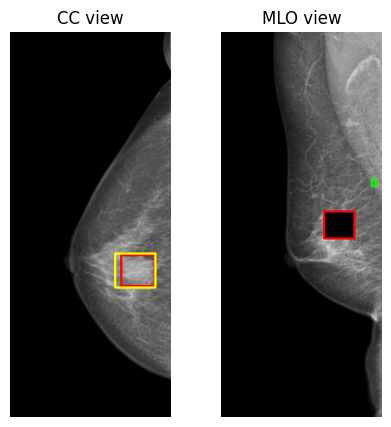

 21%|█████████████████████████████████████████████████████████▊                                                                                                                                                                                                                        | 422/2000 [14:40<53:33,  2.04s/it]

torch.Size([8, 1000, 1000])
tensor([0.0002], grad_fn=<TopkBackward0>)
tensor([17])
tensor([[215.8081, 600.0433, 294.8616, 651.3616]])


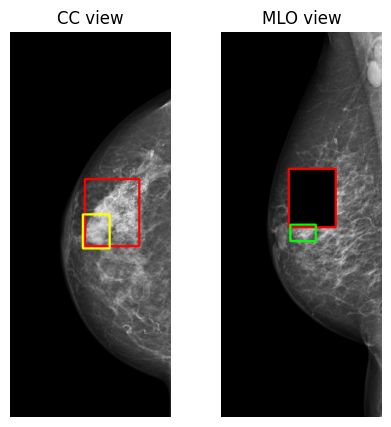

torch.Size([8, 1000, 1000])
tensor([5.6242e-05], grad_fn=<TopkBackward0>)
tensor([761])
tensor([[132.8347, 648.2832, 277.0899, 851.1923]])


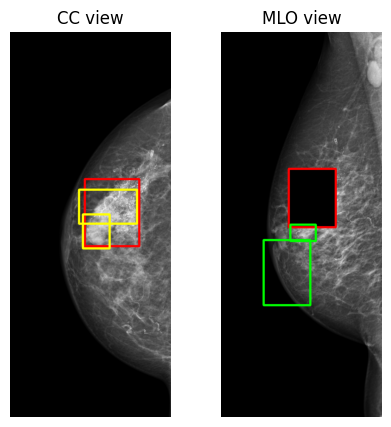

 22%|█████████████████████████████████████████████████████████████▏                                                                                                                                                                                                                    | 447/2000 [15:31<51:42,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0010], grad_fn=<TopkBackward0>)
tensor([107])
tensor([[190.6276, 664.2787, 223.5165, 700.5050]])


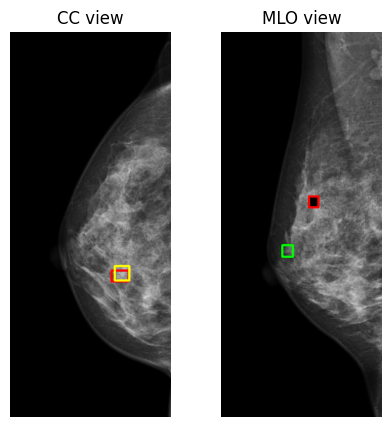

 23%|████████████████████████████████████████████████████████████████▎                                                                                                                                                                                                                 | 469/2000 [16:16<52:02,  2.04s/it]

torch.Size([8, 1000, 1000])
tensor([3.9017e-05], grad_fn=<TopkBackward0>)
tensor([798])
tensor([[  0.0000,   0.0000, 317.3641, 245.0597]])


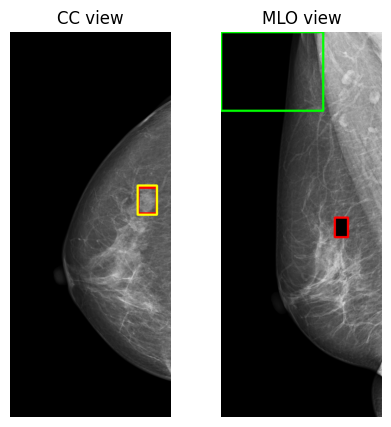

 24%|█████████████████████████████████████████████████████████████████▍                                                                                                                                                                                                                | 478/2000 [16:34<51:57,  2.05s/it]

torch.Size([8, 1000, 1000])
tensor([9.9653e-05], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[317.0719, 631.5399, 450.0842, 768.2748]])


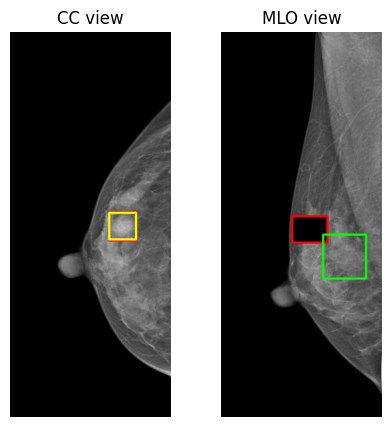

 24%|██████████████████████████████████████████████████████████████████▉                                                                                                                                                                                                               | 489/2000 [16:57<50:16,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0008], grad_fn=<TopkBackward0>)
tensor([1])
tensor([[288.2477, 725.8311, 338.8397, 774.1774]])


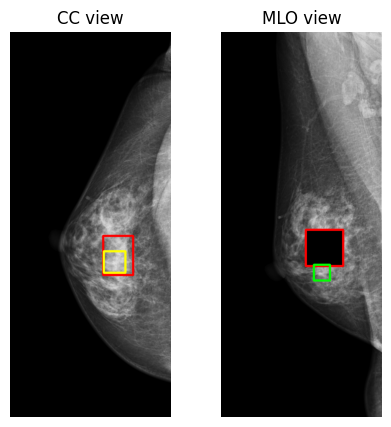

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([1])
tensor([[288.2477, 725.8311, 338.8397, 774.1774]])


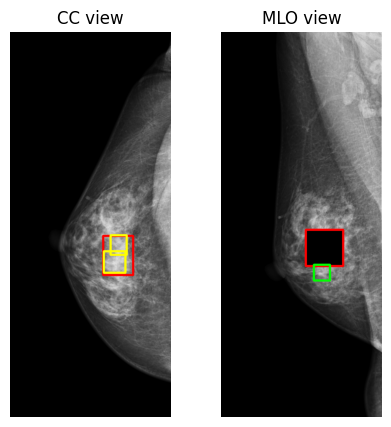

 28%|███████████████████████████████████████████████████████████████████████████▌                                                                                                                                                                                                      | 552/2000 [19:07<48:20,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([7.2065e-06], grad_fn=<TopkBackward0>)
tensor([935])
tensor([[349.9723, 728.9730, 379.6823, 752.4481]])


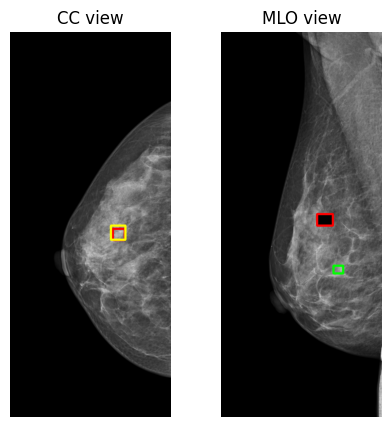

 29%|███████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                                                  | 582/2000 [20:08<47:27,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([0.0015], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[303.9543, 425.4013, 354.0598, 484.4434]])


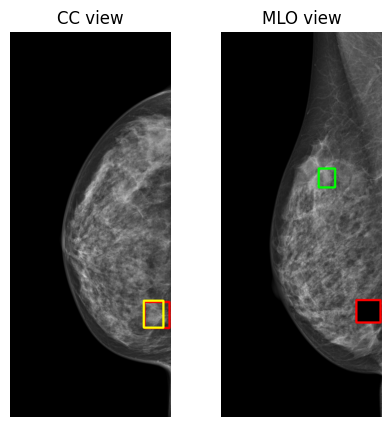

 30%|█████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                                                                | 597/2000 [20:39<47:11,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([0.0008], grad_fn=<TopkBackward0>)
tensor([38])
tensor([[443.7754, 723.5994, 476.4903, 764.1712]])


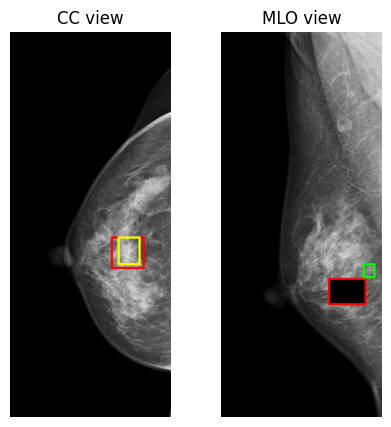

 33%|█████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                                                                        | 651/2000 [22:27<45:04,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([0.0009], grad_fn=<TopkBackward0>)
tensor([22])
tensor([[228.1383, 760.3695, 326.5921, 820.6323]])


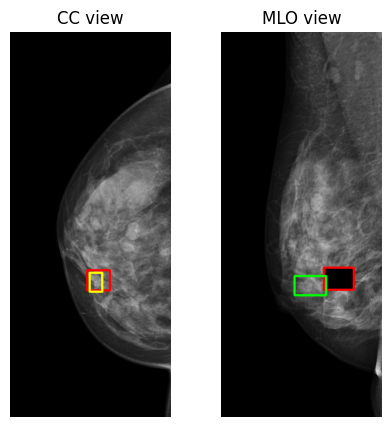

 35%|██████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                                                   | 692/2000 [23:51<44:47,  2.05s/it]

torch.Size([8, 1000, 1000])
tensor([0.0010], grad_fn=<TopkBackward0>)
tensor([14])
tensor([[348.6337, 507.9966, 393.0530, 551.1508]])


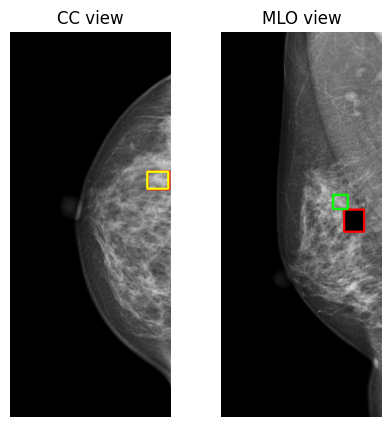

 35%|████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                                                 | 708/2000 [24:24<44:05,  2.05s/it]

torch.Size([8, 1000, 1000])
tensor([4.0581e-05], grad_fn=<TopkBackward0>)
tensor([832])
tensor([[293.6531, 576.3159, 313.0609, 598.4039]])


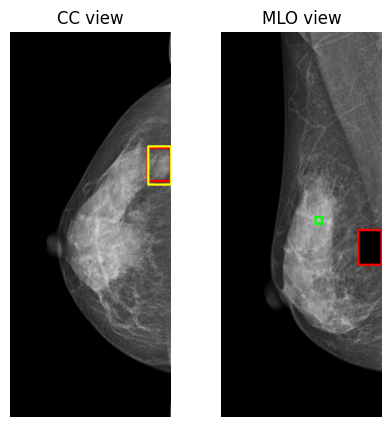

 39%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                      | 783/2000 [26:56<41:37,  2.05s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[342.0897, 484.5239, 438.9631, 578.8690]])


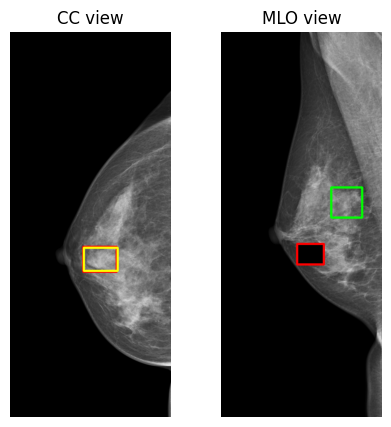

 40%|████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                                     | 791/2000 [27:12<40:34,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[422.3452, 910.9584, 472.0416, 958.2341]])


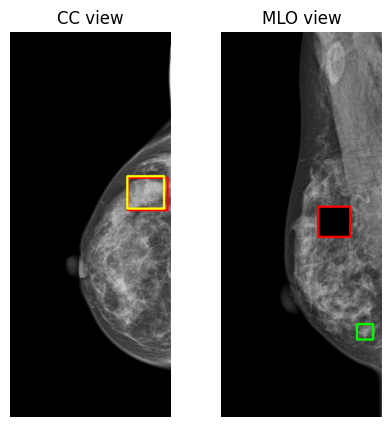

 43%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                                            | 860/2000 [29:32<38:54,  2.05s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([5])
tensor([[439.2866, 887.4440, 487.6050, 941.7172]])


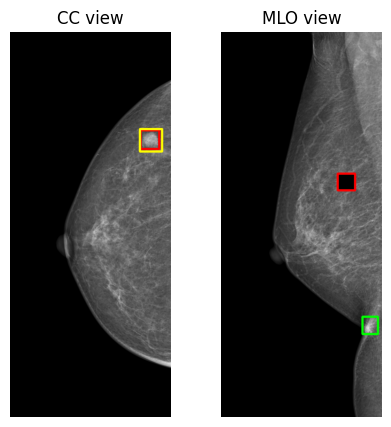

 43%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                                            | 862/2000 [29:36<39:11,  2.07s/it]

torch.Size([8, 1000, 1000])
tensor([8.8703e-05], grad_fn=<TopkBackward0>)
tensor([117])
tensor([[260.5789, 759.1238, 288.7130, 807.3732]])


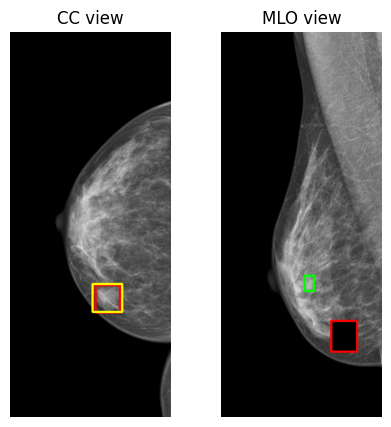

 44%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                         | 883/2000 [30:19<38:20,  2.06s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004], grad_fn=<TopkBackward0>)
tensor([17])
tensor([[277.9860, 465.4724, 376.4648, 622.3444]])


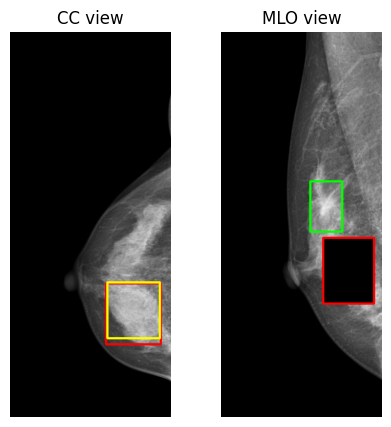

 46%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                                    | 916/2000 [31:26<37:40,  2.09s/it]

torch.Size([8, 1000, 1000])
tensor([0.0012], grad_fn=<TopkBackward0>)
tensor([7])
tensor([[372.8603, 812.2704, 447.0276, 899.4255]])


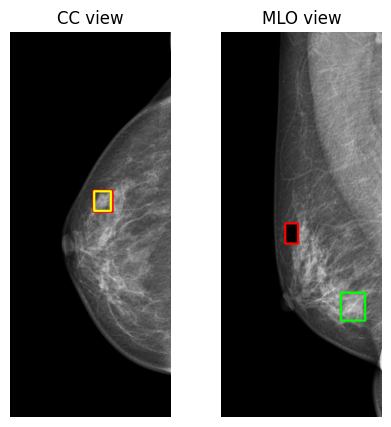

 47%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                                | 944/2000 [32:23<35:43,  2.03s/it]

torch.Size([8, 1000, 1000])
tensor([1.8383e-05], grad_fn=<TopkBackward0>)
tensor([937])
tensor([[273.5368, 659.1223, 305.6244, 696.6962]])


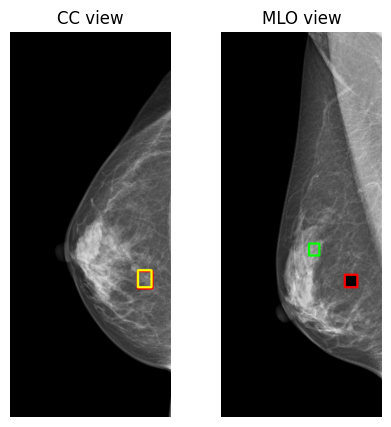

 48%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                                               | 957/2000 [32:50<35:27,  2.04s/it]

torch.Size([8, 1000, 1000])
tensor([0.0001], grad_fn=<TopkBackward0>)
tensor([543])
tensor([[231.2300, 580.2912, 253.0318, 609.1124]])


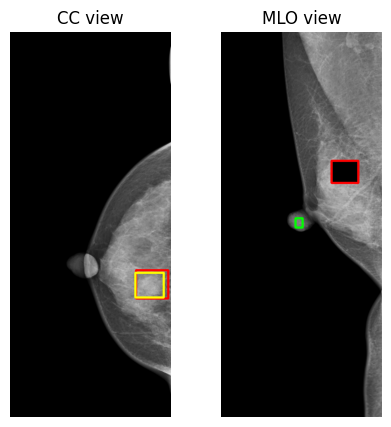

 49%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                                          | 987/2000 [33:50<33:50,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([8.8431e-05], grad_fn=<TopkBackward0>)
tensor([113])
tensor([[184.4078, 724.8800, 222.0324, 768.2528]])


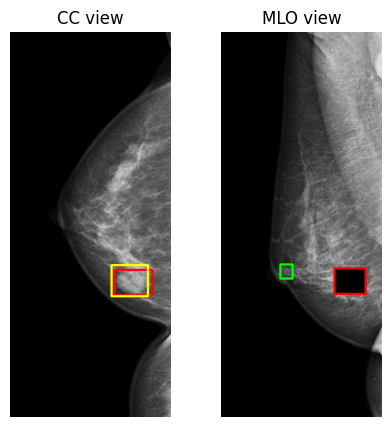

 50%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                                                                                                         | 999/2000 [34:14<33:48,  2.03s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([61])
tensor([[258.0171, 663.8167, 303.0999, 718.2488]])


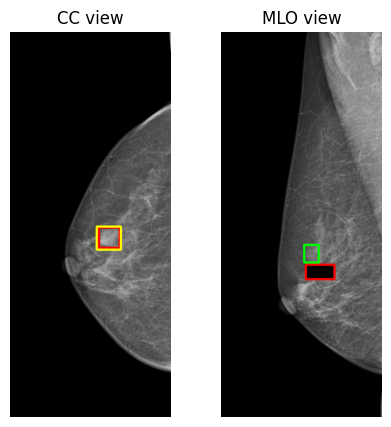

 51%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                                    | 1029/2000 [35:15<32:39,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([4.3606e-05], grad_fn=<TopkBackward0>)
tensor([184])
tensor([[238.1154, 863.1494, 252.5179, 879.1903]])


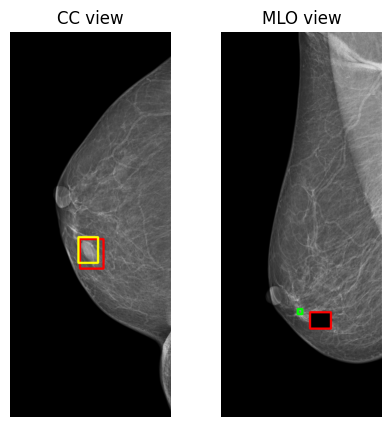

 52%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                    | 1031/2000 [35:20<32:55,  2.04s/it]

torch.Size([8, 1000, 1000])
tensor([3.4113e-05], grad_fn=<TopkBackward0>)
tensor([63])
tensor([[179.5598, 424.6760, 269.0125, 567.4978]])


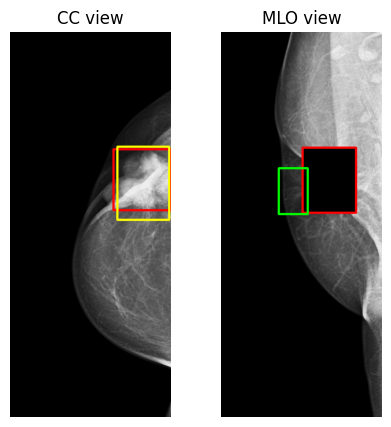

 52%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                                                                                  | 1043/2000 [35:45<33:08,  2.08s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[216.1467, 773.9112, 282.3493, 831.1434]])


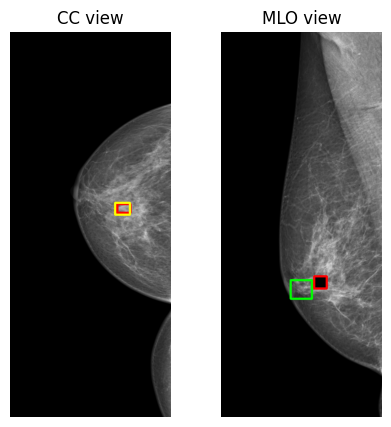

 54%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                                                                              | 1077/2000 [36:53<31:30,  2.05s/it]

torch.Size([8, 1000, 1000])
tensor([0.0002], grad_fn=<TopkBackward0>)
tensor([94])
tensor([[377.5601, 567.2476, 402.7602, 616.2101]])


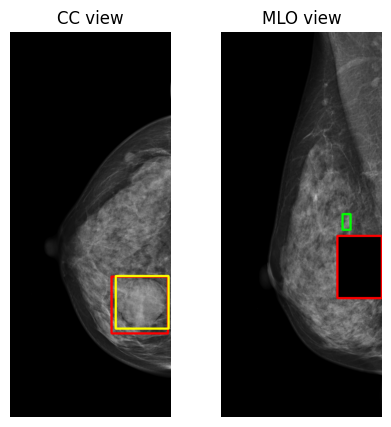

 55%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                                          | 1104/2000 [37:49<29:43,  1.99s/it]

torch.Size([8, 1000, 1000])
tensor([3.5298e-05], grad_fn=<TopkBackward0>)
tensor([553])
tensor([[ 49.8610,   0.0000, 365.3597, 158.7635]])


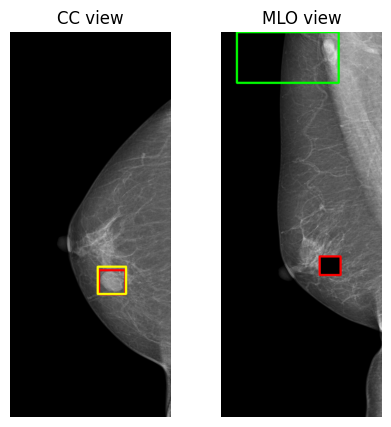

 57%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                                                    | 1144/2000 [39:09<28:35,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[282.1990, 594.0806, 331.9207, 641.2852]])


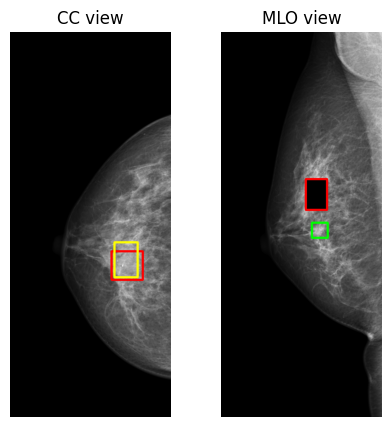

 58%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                                   | 1153/2000 [39:27<28:24,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([2.8902e-05], grad_fn=<TopkBackward0>)
tensor([906])
tensor([[346.9283, 787.3850, 367.4278, 808.1095]])


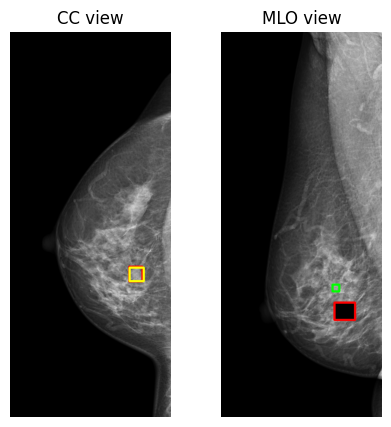

 60%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                              | 1191/2000 [40:44<26:52,  1.99s/it]

torch.Size([8, 1000, 1000])
tensor([8.3606e-05], grad_fn=<TopkBackward0>)
tensor([1])
tensor([[266.1939, 840.7346, 405.2538, 965.8455]])


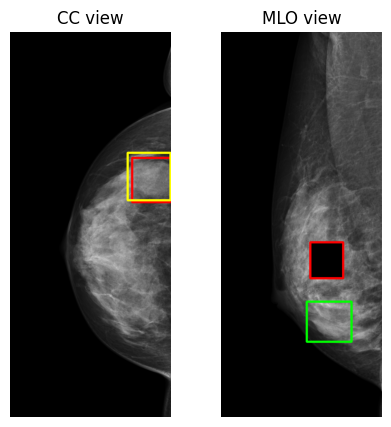

 61%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                           | 1213/2000 [41:29<27:17,  2.08s/it]

torch.Size([8, 1000, 1000])
tensor([8.0742e-05], grad_fn=<TopkBackward0>)
tensor([419])
tensor([[114.4081,   0.0000, 300.6026,  73.6639]])


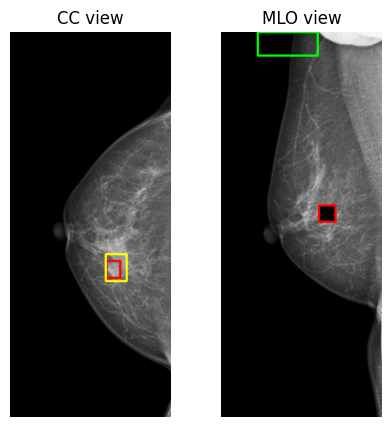

 61%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                          | 1220/2000 [41:43<26:12,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([0.0001], grad_fn=<TopkBackward0>)
tensor([11])
tensor([[209.4143, 668.3259, 369.7666, 754.6861]])


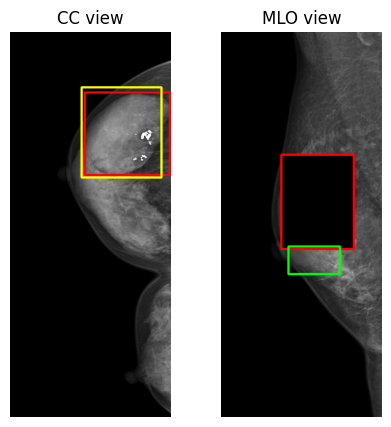

 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                       | 1243/2000 [42:30<25:31,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007], grad_fn=<TopkBackward0>)
tensor([5])
tensor([[220.2941, 748.8456, 261.1129, 800.2064]])


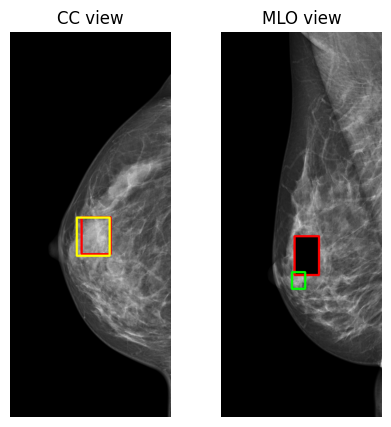

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                     | 1256/2000 [42:56<24:43,  1.99s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006], grad_fn=<TopkBackward0>)
tensor([10])
tensor([[307.5245, 900.4149, 345.8726, 946.1295]])


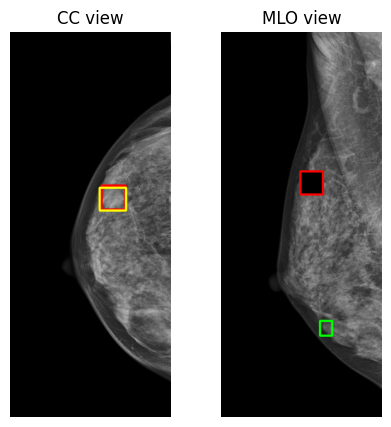

 63%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                     | 1258/2000 [43:00<25:42,  2.08s/it]

torch.Size([8, 1000, 1000])
tensor([0.0010], grad_fn=<TopkBackward0>)
tensor([4])
tensor([[426.2111, 793.0120, 485.8920, 850.8867]])


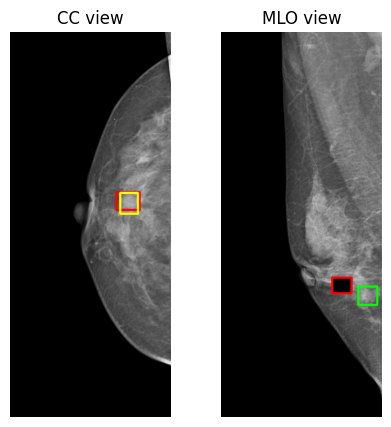

 63%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                                    | 1265/2000 [43:15<25:45,  2.10s/it]

torch.Size([8, 1000, 1000])
tensor([0.0012], grad_fn=<TopkBackward0>)
tensor([12])
tensor([[214.6227, 415.6843, 304.4349, 476.7702]])


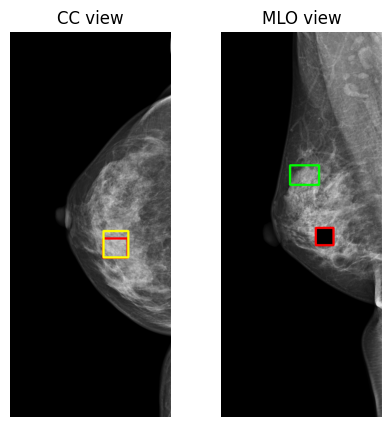

 65%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                                                | 1293/2000 [44:12<23:59,  2.04s/it]

torch.Size([8, 1000, 1000])
tensor([1.3490e-05], grad_fn=<TopkBackward0>)
tensor([127])
tensor([[441.9925, 434.8163, 461.5136, 454.9067]])


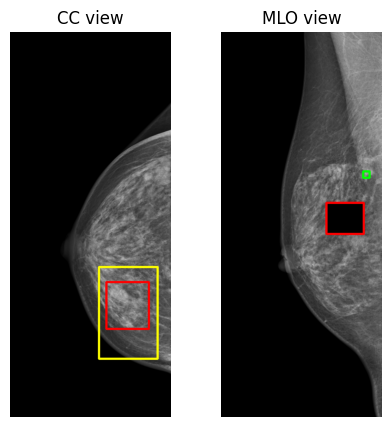

 65%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                              | 1309/2000 [44:44<23:07,  2.01s/it]

torch.Size([8, 1000, 1000])
tensor([2.0203e-05], grad_fn=<TopkBackward0>)
tensor([56])
tensor([[414.0769, 478.9399, 428.6956, 498.0118]])


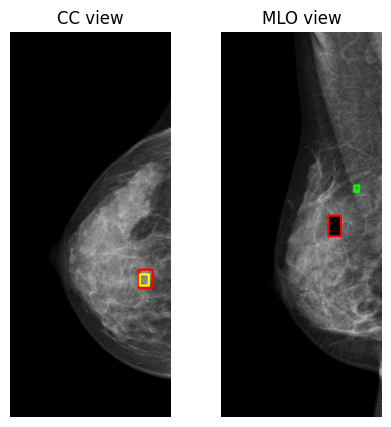

torch.Size([8, 1000, 1000])
tensor([5.4079e-06], grad_fn=<TopkBackward0>)
tensor([834])
tensor([[332.2763, 652.9711, 353.6535, 675.4310]])


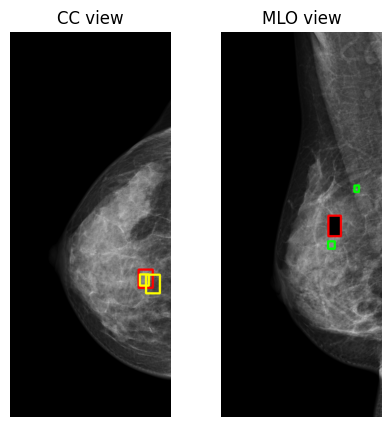

 71%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                               | 1416/2000 [48:21<19:58,  2.05s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006], grad_fn=<TopkBackward0>)
tensor([564])
tensor([[447.4122, 265.0910, 486.6089, 313.2987]])


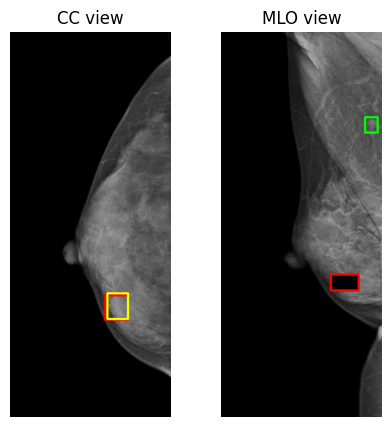

 72%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                                                             | 1431/2000 [48:52<19:11,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([4.3340e-05], grad_fn=<TopkBackward0>)
tensor([604])
tensor([[121.4228, 369.7627, 249.0397, 574.9294]])


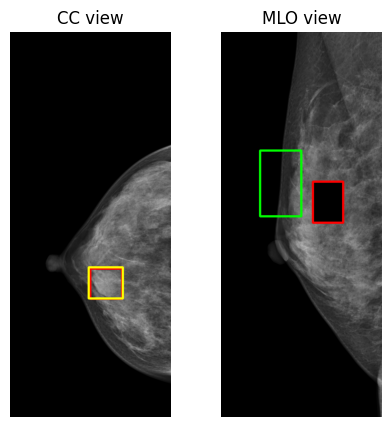

 73%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                           | 1451/2000 [49:33<18:07,  1.98s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([14])
tensor([[177.2202, 748.8013, 271.9509, 805.0937]])


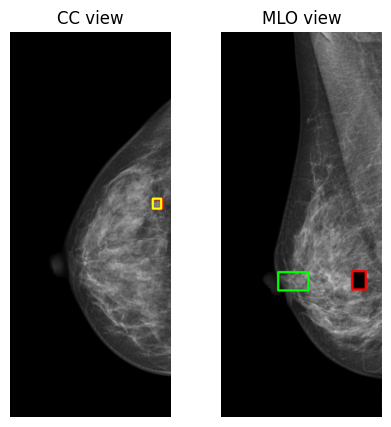

 73%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                                        | 1468/2000 [50:08<17:46,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([0.0010], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[262.4240, 629.9048, 323.1033, 694.9788]])


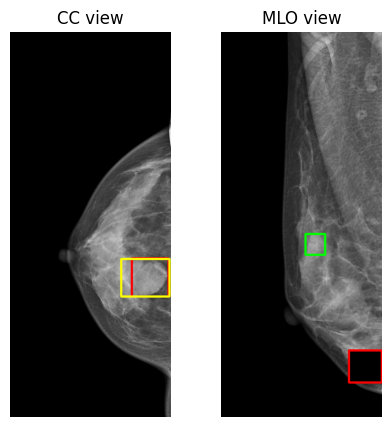

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                | 1528/2000 [52:10<15:45,  2.00s/it]

torch.Size([8, 1000, 1000])
tensor([7.6668e-05], grad_fn=<TopkBackward0>)
tensor([16])
tensor([[249.5399, 452.4342, 276.2686, 495.7634]])


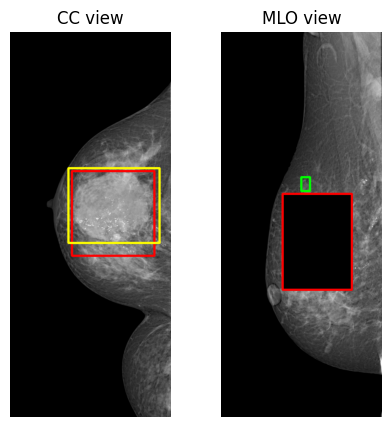

 76%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                | 1529/2000 [52:12<16:13,  2.07s/it]

torch.Size([8, 1000, 1000])
tensor([0.0002], grad_fn=<TopkBackward0>)
tensor([53])
tensor([[303.8111, 630.5073, 372.3454, 731.7230]])


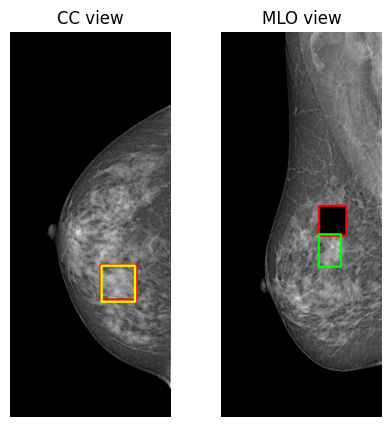

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                                                | 1532/2000 [52:18<15:43,  2.02s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[327.3866, 492.8177, 403.3620, 564.0938]])


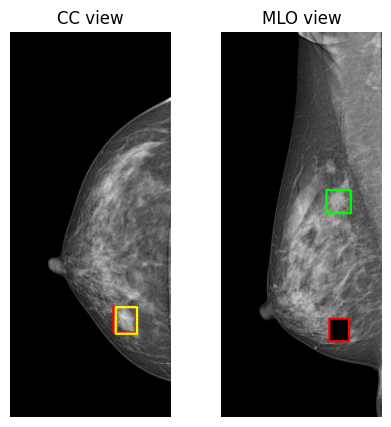

 77%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                               | 1537/2000 [52:28<15:17,  1.98s/it]

torch.Size([8, 1000, 1000])
tensor([0.0029], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[309.7101, 780.0457, 420.6407, 895.4937]])


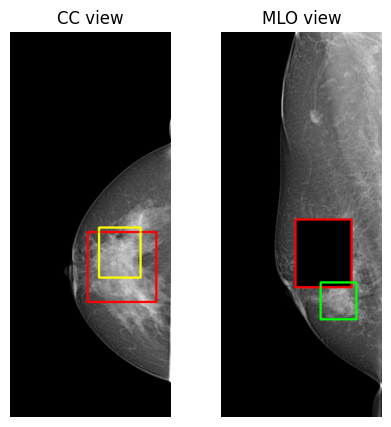

torch.Size([8, 1000, 1000])
tensor([8.1333e-05], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[309.7101, 780.0457, 420.6407, 895.4937]])


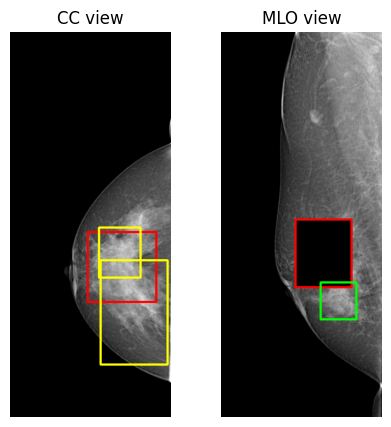

 77%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                              | 1540/2000 [52:35<15:48,  2.06s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[347.4037, 738.2253, 413.7231, 809.1683]])


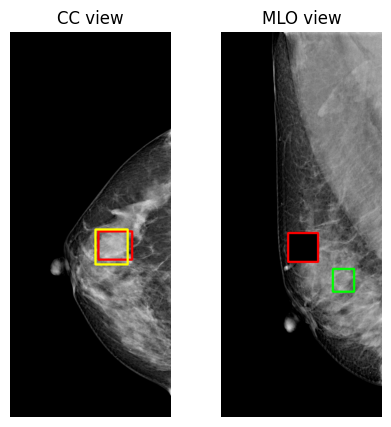

 79%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                                         | 1578/2000 [53:49<13:40,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0002], grad_fn=<TopkBackward0>)
tensor([14])
tensor([[341.5143, 443.1535, 398.0762, 531.4723]])


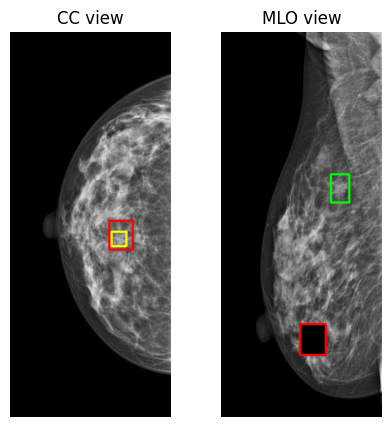

 80%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                                                      | 1604/2000 [54:40<12:43,  1.93s/it]

torch.Size([8, 1000, 1000])
tensor([0.0010], grad_fn=<TopkBackward0>)
tensor([4])
tensor([[205.5396, 793.0323, 276.1514, 871.4449]])


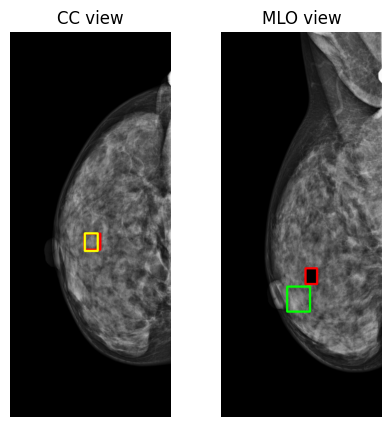

 82%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                  | 1631/2000 [55:33<12:06,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[227.4430, 718.0380, 283.8446, 774.9017]])


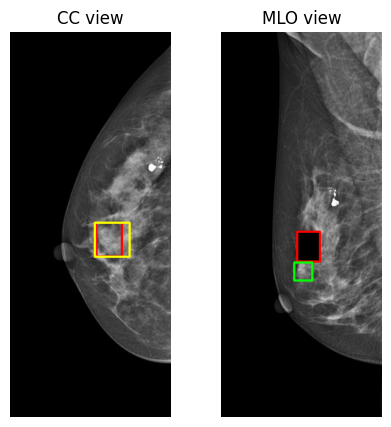

 82%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                | 1645/2000 [56:00<11:31,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0007], grad_fn=<TopkBackward0>)
tensor([3])
tensor([[303.8561, 795.8681, 365.2355, 862.6396]])


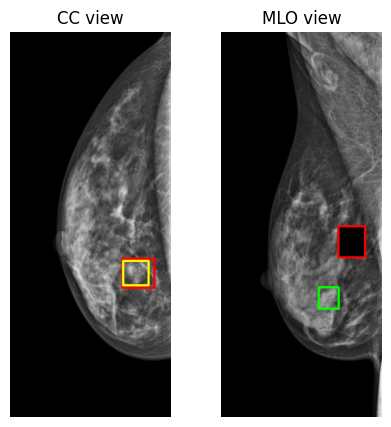

 83%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                               | 1656/2000 [56:22<11:10,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[371.8002, 732.2084, 434.0486, 788.4272]])


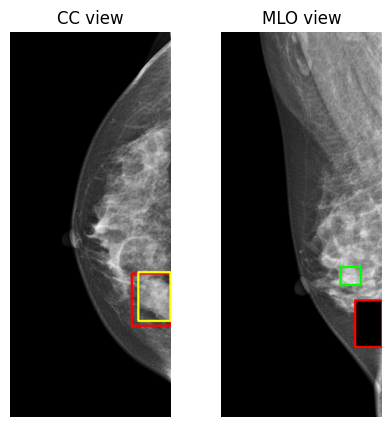

 84%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                          | 1688/2000 [57:25<09:58,  1.92s/it]

torch.Size([8, 1000, 1000])
tensor([9.2001e-05], grad_fn=<TopkBackward0>)
tensor([59])
tensor([[287.5879, 914.1000, 446.8280, 995.6248]])


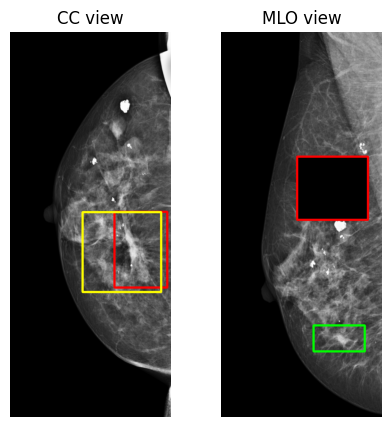

 85%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████                                        | 1707/2000 [58:02<09:29,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0002], grad_fn=<TopkBackward0>)
tensor([0])
tensor([[233.5621, 330.0369, 295.8466, 382.4354]])


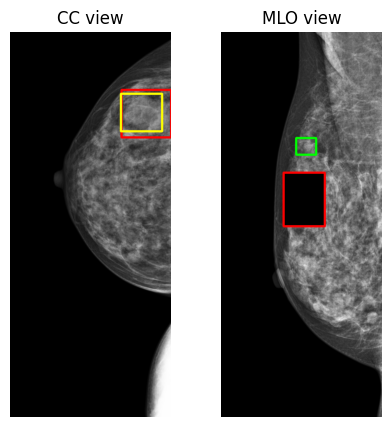

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                                     | 1725/2000 [58:36<08:42,  1.90s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006], grad_fn=<TopkBackward0>)
tensor([13])
tensor([[215.3993, 762.3785, 328.2843, 828.6614]])


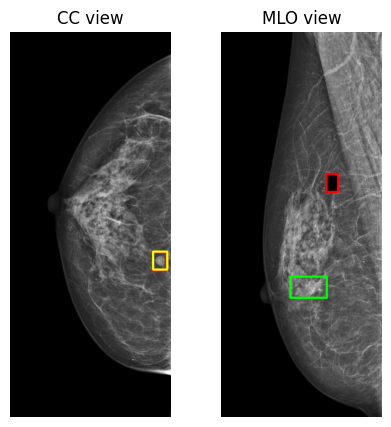

 86%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                     | 1727/2000 [58:40<08:52,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([2])
tensor([[278.9117, 745.6608, 361.2705, 822.3678]])


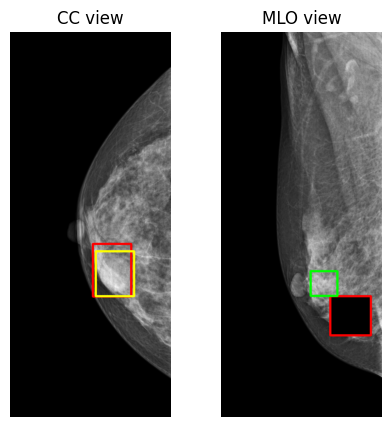

 87%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                    | 1733/2000 [58:52<08:40,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006], grad_fn=<TopkBackward0>)
tensor([2])
tensor([[298.5293, 544.4177, 342.2032, 588.1220]])


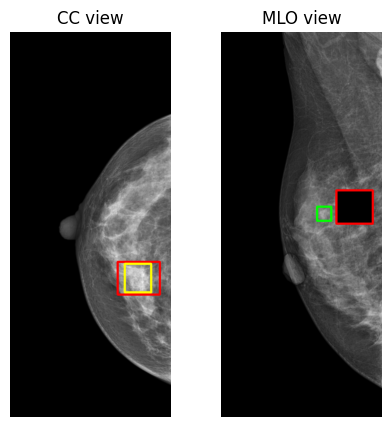

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                              | 1773/2000 [1:00:11<07:21,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([6.7748e-05], grad_fn=<TopkBackward0>)
tensor([242])
tensor([[402.8286, 633.2923, 436.6785, 675.0494]])


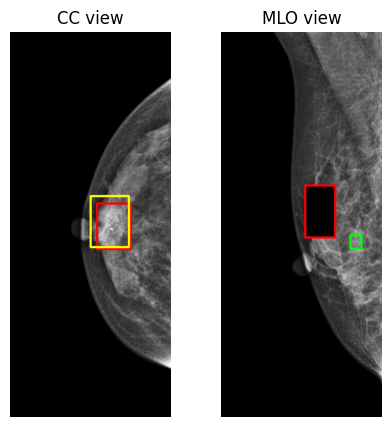

 89%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                              | 1778/2000 [1:00:21<07:16,  1.97s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004], grad_fn=<TopkBackward0>)
tensor([1])
tensor([[166.2099, 682.5928, 288.0222, 818.9883]])


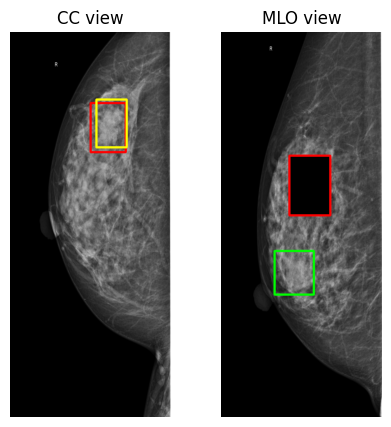

 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                            | 1789/2000 [1:00:42<06:58,  1.98s/it]

torch.Size([8, 1000, 1000])
tensor([5.0510e-05], grad_fn=<TopkBackward0>)
tensor([661])
tensor([[272.9091, 767.5053, 287.7944, 786.4184]])


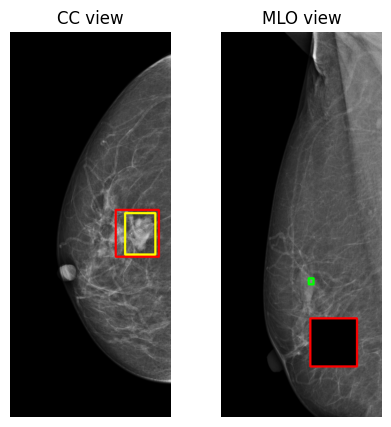

 91%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                       | 1828/2000 [1:01:59<05:35,  1.95s/it]

torch.Size([8, 1000, 1000])
tensor([0.0008], grad_fn=<TopkBackward0>)
tensor([1])
tensor([[269.2566, 322.5462, 355.9856, 425.2762]])


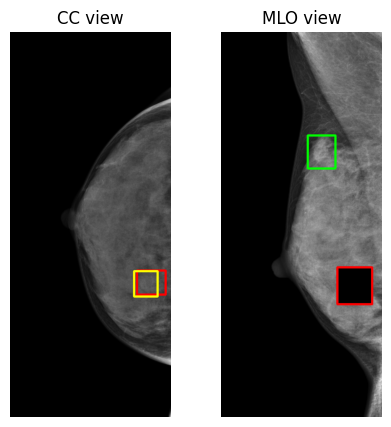

 92%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉                      | 1837/2000 [1:02:17<05:15,  1.93s/it]

torch.Size([8, 1000, 1000])
tensor([0.0006], grad_fn=<TopkBackward0>)
tensor([11])
tensor([[291.2825, 284.2051, 332.7779, 334.2751]])


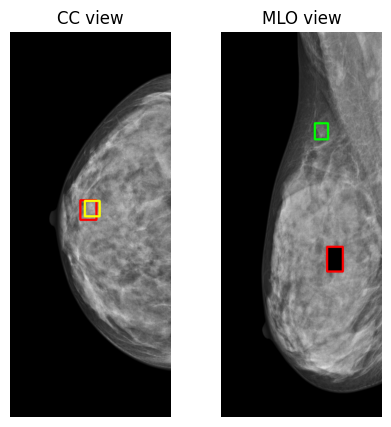

 97%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏        | 1935/2000 [1:05:31<02:17,  2.11s/it]

torch.Size([8, 1000, 1000])
tensor([0.0002], grad_fn=<TopkBackward0>)
tensor([1])
tensor([[302.9560, 103.3356, 398.9764, 193.2119]])


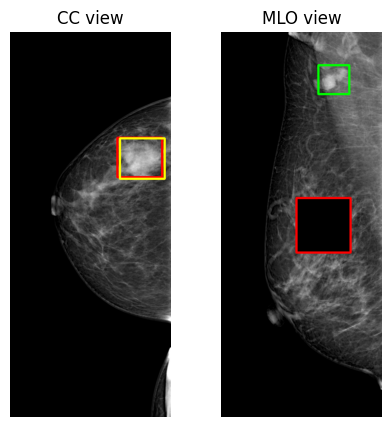

 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋      | 1953/2000 [1:06:09<01:39,  2.12s/it]

torch.Size([8, 1000, 1000])
tensor([0.0013], grad_fn=<TopkBackward0>)
tensor([2])
tensor([[435.7090, 696.6201, 496.4145, 781.8234]])


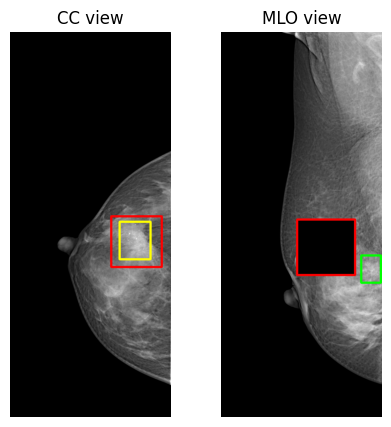

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████      | 1956/2000 [1:06:16<01:35,  2.16s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([19])
tensor([[299.5214, 517.8479, 347.3659, 606.8193]])


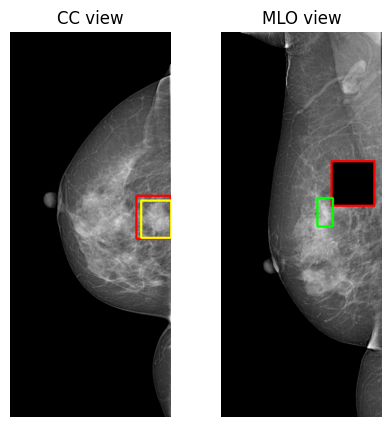

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋     | 1961/2000 [1:06:27<01:25,  2.18s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([60])
tensor([[306.6942, 649.9738, 408.9227, 718.5867]])


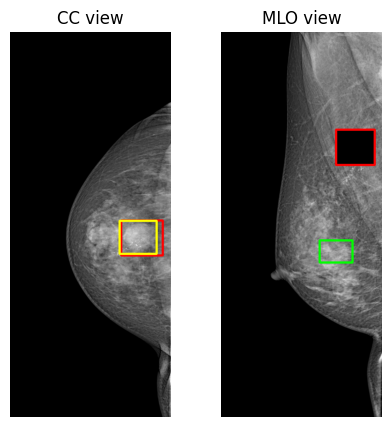

 98%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▉     | 1963/2000 [1:06:31<01:21,  2.21s/it]

torch.Size([8, 1000, 1000])
tensor([0.0003], grad_fn=<TopkBackward0>)
tensor([3])
tensor([[ 377.3995,  919.6353,  460.8589, 1001.1104]])


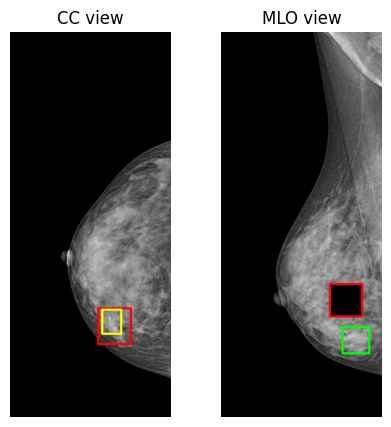

 98%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋    | 1968/2000 [1:06:42<01:08,  2.15s/it]

torch.Size([8, 1000, 1000])
tensor([6.4667e-05], grad_fn=<TopkBackward0>)
tensor([854])
tensor([[367.0506, 410.6857, 500.0000, 603.2172]])


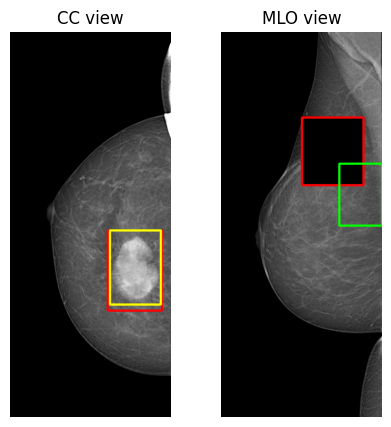

 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████  | 1986/2000 [1:07:19<00:25,  1.86s/it]

torch.Size([8, 1000, 1000])
tensor([0.0004], grad_fn=<TopkBackward0>)
tensor([32])
tensor([[370.5700,  19.8377, 474.6528, 173.2686]])


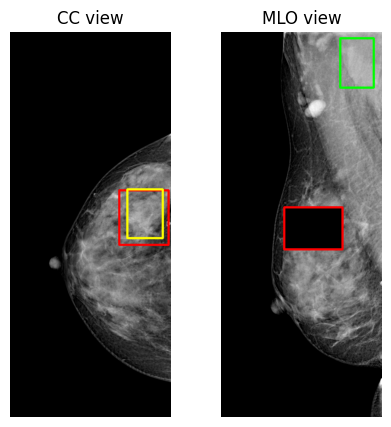

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2000/2000 [1:07:45<00:00,  2.03s/it]

num_data 92
num_data_true 0
num_pred 97
num_true 0
acc 0.0
recall 0.0


In [14]:
device=DEVICE
#model.roi_heads.score_thresh =0.01
num_data= 0
num_pred =0
num_true=0
num_data_true=0
for images_CC, images_MLO, targets_CC, targets_MLO in tqdm(valid_loader_mask):
    images_CC = list(image_CC.to(device) for image_CC in images_CC)
    images_MLO = list(image_MLO.to(device) for image_MLO in images_MLO)
    #images = torch.stack(images)
    #print(images.shape)
    #images = images.to(device)
    targets_CC = [{k: v.to(device) for k, v in t.items()} for t in targets_CC]
    targets_MLO = [{k: v.to(device) for k, v in t.items()} for t in targets_MLO]

    if torch.cuda.is_available():
        torch.cuda.synchronize()
    model_time = time.time()
    outputs_CC, outputs_MLO= model(images_CC, images_MLO, targets_CC, targets_MLO)
        #print('out',outputs)
        #print('tar',targets)
    #####################################
    for i in range(len(images_CC)):
        true_dict_CC = dict()
        true_dict_MLO = dict()
        preds_dict_CC = dict()
        preds_dict_MLO = dict()
        true_dict_CC['boxes'] = targets_CC[i]['boxes']
        true_dict_CC['labels'] = targets_CC[i]['labels']
        preds_dict_CC['boxes'] = outputs_CC[i]['boxes']
        preds_dict_CC['scores'] = outputs_CC[i]['scores']
        preds_dict_CC['labels'] = outputs_CC[i]['labels']
        
        true_dict_MLO['boxes'] = targets_MLO[i]['boxes']
        true_dict_MLO['labels'] = targets_MLO[i]['labels']
        preds_dict_MLO['boxes'] = outputs_MLO[i]['boxes']
        preds_dict_MLO['scores'] = outputs_MLO[i]['scores']
        preds_dict_MLO['labels'] = outputs_MLO[i]['labels']
        img_CC = images_CC[i]
        img_MLO = images_MLO[i]
        
        #img = invTrans(img)[0]
        img_CC= img_CC.permute(1,2,0)
        img_MLO = img_MLO.permute(1,2,0)
        img_CC = img_CC.cpu().numpy().copy()
        img_MLO = img_MLO.cpu().numpy().copy()
        if len(true_dict_MLO['labels']) == 1 and len(true_dict_CC['labels'])==1:
            num_data+=1 
            check= False
            for j in range(len(true_dict_CC['labels'])):
                x_min, y_min, x_max, y_max = true_dict_CC['boxes'][j]
                img_CC =cv2.rectangle(img=img_CC,pt1= (int(x_min),int(y_min)),pt2= (int(x_max),int(y_max)), color = (1.0,0,0),thickness =5)
            for j in range(len(true_dict_MLO['labels'])):
                x_min, y_min, x_max, y_max = true_dict_MLO['boxes'][j]
                img_MLO =cv2.rectangle(img=img_MLO,pt1= (int(x_min),int(y_min)),pt2= (int(x_max),int(y_max)), color = (1.0,0,0),thickness =5)
            for j in range(len(true_dict_CC['labels'])):
                
                for k in range(len(preds_dict_CC['labels'])):
                    if true_dict_CC['labels'][j] == preds_dict_CC['labels'][k]:
                        pred_box= preds_dict_CC['boxes'][k].clone()
                        pred_box[2:] -= pred_box[:2]
                        true_box= true_dict_CC['boxes'][j].clone()
                        true_box[2:]-= true_box[:2]
                        iou_score= get_iou_score(true_box, pred_box)
                        
                        if iou_score>0.2:
                            num_pred+=1
                            model.zero_grad()
                            #preds_dict_CC['scores'][i].backward(retain_graph=True)
                            print(model.roi_heads.crossview.decoder.layers[0][0].attn.shape)
                            grad=torch.autograd.grad(preds_dict_CC['scores'][k], [model.roi_heads.crossview.decoder.layers[0][0].attn], retain_graph=True)[0]
                            index_CC = model.roi_heads.index[i]["CC"][k]
                            cam = model.roi_heads.crossview.decoder.layers[0][0].attn
                            #print(model.roi_heads.crossview.decoder.layers[0][0].tgt2.grad)
                            #grad = model.roi_heads.crossview.decoder.layers[0][0].attn.grad
                            cam = grad*cam
                            cam = cam.clamp(min=0).mean(dim=0)
                            R =cam[index_CC]
                            value, indices = torch.topk(R, 1)
                            print(value)
                            print(indices)
                            print(model.roi_heads.proposals[i]['MLO'][indices])
                            x_min, y_min, x_max, y_max = preds_dict_CC['boxes'][k]
                            img_CC =cv2.rectangle(img=img_CC,pt1= (int(x_min),int(y_min)),pt2= (int(x_max),int(y_max)), color = (1.0,1.0,0),thickness =5)
                            #score =preds_dict_CC['scores'][k]
                            #cv2.putText(img_CC, f'{score}', (int(x_min), int(y_min-10)), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (1.0,1.0,0), 5)
                            
                            for boxes_MLO_pred in model.roi_heads.proposals[i]['MLO'][indices]:
                                x_min, y_min, x_max, y_max = boxes_MLO_pred
                                img_MLO = cv2.rectangle(img=img_MLO,pt1= (int(x_min),int(y_min)),pt2= (int(x_max),int(y_max)), color = (0,1.0,0),thickness =5)
                                boxes_MLO =true_dict_MLO['boxes'][0]
                                pred_box_MLO= boxes_MLO_pred.clone()
                                pred_box_MLO[2:] -= pred_box_MLO[:2]
                                true_box_MLO= boxes_MLO.clone()
                                true_box_MLO[2:]-= true_box_MLO[:2]
                                iou_score= get_iou_score(true_box_MLO, pred_box_MLO)
                                if iou_score>=0.2:
                                    num_true+=1
                                    check= True
                            fig, axs= plt.subplots(1,2,figsize=(5,5))
                            axs[0].imshow(img_CC)
                            axs[0].axis('off')
                            axs[0].set_title("CC view")
                            axs[1].imshow(img_MLO)
                            axs[1].axis('off')
                            axs[1].set_title("MLO view")
                            plt.show()
            if check: 
                num_data_true+=1
print('num_data',num_data)
print('num_data_true',num_data_true)
print('num_pred', num_pred)
print('num_true', num_true)
print('acc', num_true/num_pred)
print('recall', num_data_true/num_data)